# Imports and setup

In [1]:
import arviz as az
import jax
jax.config.update("jax_enable_x64", True)
import jax.numpy as jnp

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

import numpy as np
import numpyro
import numpyro.distributions as dist
from numpyro.handlers import seed
from numpyro.infer import MCMC, NUTS, SVI, Predictive, Trace_ELBO
from numpyro.infer.autoguide import AutoDelta, AutoNormal, AutoDiagonalNormal
from numpyro.infer.util import log_density
from scipy.interpolate import InterpolatedUnivariateSpline

from stream_membership import ComponentMixtureModel, ModelComponent
from stream_membership.distributions import IndependentGMM, TruncatedNormalSpline, DirichletSpline
from stream_membership.plot import plot_data_projections

import astropy.table as at
import astropy.units as u

import pickle

from scipy.stats import binned_statistic
from scipy.interpolate import InterpolatedUnivariateSpline as IUS

In [2]:
import sys
sys.path.append('../../')
sys.path.append('/Users/Tavangar/Work/CATS_workshop/cats/')

# from gd1_helpers.membership.gd1_model import (
#     Base,
#     BackgroundModel,
#     StreamDensModel,
#     OffTrackModel,
#     MixtureModel
# )
# from gd1_helpers.membership.initialize import *
# from scripts.gd1_init import *

from cats.pawprint.pawprint import Pawprint, Footprint2D
from cats.CMD import Isochrone
from cats.inputs import stream_inputs as inputs
from cats.proper_motions import ProperMotionSelection, rough_pm_poly

In [3]:
data = at.Table.read("../../../CATS_Workshop/cats/data/joined-GD-1.fits")

#data = at.Table.read('../data/tmp/run_data.fits')
#masks = at.Table.read('../data/tmp/run_data_masks.fits')
cat = data[data['phot_g_mean_mag'] <20.5]
cat['pm1'] = cat['pm_phi1_cosphi2_unrefl']
cat['pm2'] = cat['pm_phi2_unrefl']


stream='GD-1'
phi1_lim = (np.min(cat['phi1']), np.max(cat['phi1']))
phi1_lim = [-100,20]

cat = cat[(cat['phi1'] < phi1_lim[1]) & (cat['phi1'] > phi1_lim[0])] # clunky to hard code this

In [4]:
p = Pawprint.pawprint_from_galstreams(inputs[stream]['short_name'],
                                      inputs[stream]['pawprint_id'],
                                      width=inputs[stream]['width'] * u.deg,
                                      phi1_lim=phi1_lim)

# rough pm cut to start with (this comes only from the galstreams proper motion tracks)
p.pmprint, pm_mask = rough_pm_poly(p, cat, buffer=2)

# Create the CMD cuts
o = Isochrone(cat, inputs[stream], pawprint=p)
_, iso_mask, _, hb_mask, pprint = o.simpleSln(maxmag=22, mass_thresh=0.83)

pmsel = ProperMotionSelection(cat, inputs[stream], pprint,
                              n_dispersion_phi1=3, n_dispersion_phi2=3, cutoff=0.1)

##### rough pm cut to start with (this comes only from the galstreams proper motion tracks)
p.pmprint, pm_mask = rough_pm_poly(p, cat, buffer=2)

Modifying/extrapolating galstreams track
Modifying/extrapolating galstreams track
-40.18182129005669
Fitting for peak pm location
Pre-fitting mean PM values: -13.031, -3.108
Post-fitting (pm1_mean, pm2_mean, pm1_std, pm2_std): [np.float64(-13.271475187973863), np.float64(-3.1697646472516334), np.float64(0.5058218775428639), np.float64(0.3829921285438014)] 

Producing the polygon and mask


In [5]:
# with open('../data/gd1_pawprint.pkl', 'wb') as output_file:
#     pickle.dump(p, output_file)

In [6]:
run_data_ = o.cat[pm_mask & (iso_mask | hb_mask)]
run_data = {k: np.array(run_data_[k], dtype="f8") for k in run_data_.colnames}

# with open('../data/gd1_run_data.pkl', 'wb') as output_file:
#     pickle.dump(run_data, output_file)

bkg_data_ = o.cat[pm_mask & (iso_mask | hb_mask) & ~o.on_skymask]
bkg_data = {k: np.array(bkg_data_[k], dtype="f8") for k in bkg_data_.colnames}

# with open('../data/gd1_bkg_data.pkl', 'wb') as output_file:
#     pickle.dump(bkg_data, output_file)

stream_data_ = o.cat[pmsel.pm12_mask & (iso_mask | hb_mask) & o.on_skymask]
stream_data = {k: np.array(stream_data_[k], dtype="f8") for k in stream_data_.colnames}

# with open('../data/gd1_stream_data.pkl', 'wb') as output_file:
#     pickle.dump(stream_data, output_file)

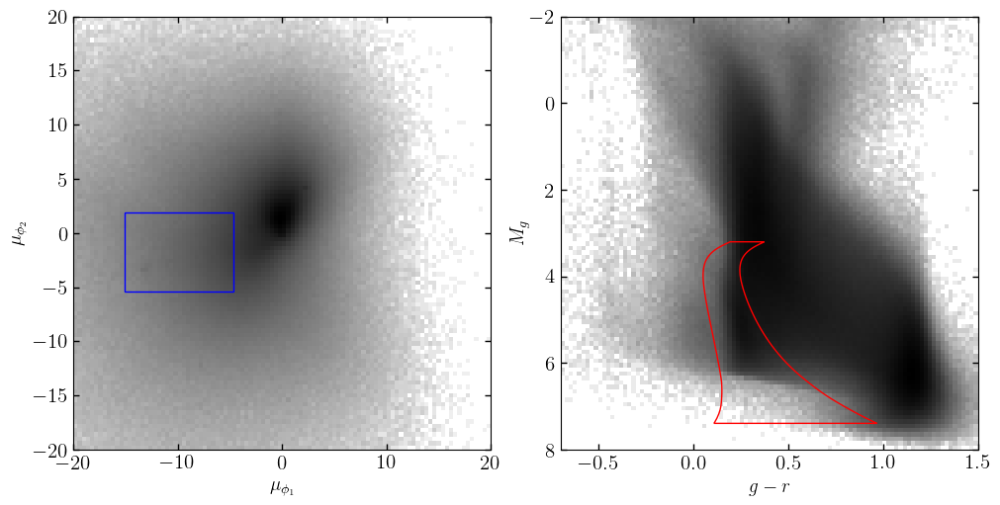

In [7]:
cmd_poly = o.pawprint.cmdprint.vertices - np.array([0,o.dist_mod])
cmd_patch = mpl.patches.Polygon(cmd_poly, edgecolor="red", facecolor="none")

pm_poly = o.pawprint.pmprint.vertices
pm_patch = mpl.patches.Polygon(pm_poly, edgecolor="blue", facecolor="none")

distmod_spl = np.poly1d([2.41e-4, 2.421e-2, 15.001])
dist_mod_correct_all = distmod_spl(o.cat["phi1"]) - o.dist_mod

fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(10,5), constrained_layout=True)
ax1.hist2d(o.cat['pm1'], o.cat['pm2'], cmap='gray_r', bins=100, range=[[-20,20],[-20,20]], 
           norm=mpl.colors.LogNorm(), rasterized=True)
ax1.add_patch(pm_patch)
ax1.set_xlim(-20,20)
ax1.set_ylim(-20,20)

ax2.hist2d(o.cat['g0'] - o.cat['r0'], o.cat['g0'] - dist_mod_correct_all  - o.dist_mod, 
           bins=100, range=[[-0.7,1.5],[-2,8]], norm=mpl.colors.LogNorm(), rasterized=True, cmap='gray_r')
ax2.add_patch(cmd_patch)
ax2.set_xlim(-0.7, 1.5)
ax2.set_ylim(8, -2)

ax1.set_xlabel(r'$\mu_{\phi_1}$', fontsize=14)
ax1.set_ylabel(r'$\mu_{\phi_2}$', fontsize=14)

ax2.set_xlabel(r'$g-r$', fontsize=14)
ax2.set_ylabel(r'$M_g$', fontsize=14, labelpad=0.1)
# plt.savefig('../../paper_figures/gd1_cuts.pdf')
plt.show()

In [8]:
phi1_lim = (np.min(run_data['phi1']), np.max(run_data['phi1']))
phi2_lim = (np.min(run_data['phi2']), np.max(run_data['phi2']))
pm1_lim = (np.min(pm_poly[:,0]), np.max(pm_poly[:,0]))
pm2_lim = (np.min(pm_poly[:,1]), np.max(pm_poly[:,1]))
plot_grids = {
    "phi1": jnp.linspace(*phi1_lim, 512),
    "phi2": jnp.linspace(*phi2_lim, 128),
    "pm1": jnp.linspace(*pm1_lim, 128),
    "pm2": jnp.linspace(*pm2_lim, 128)
}

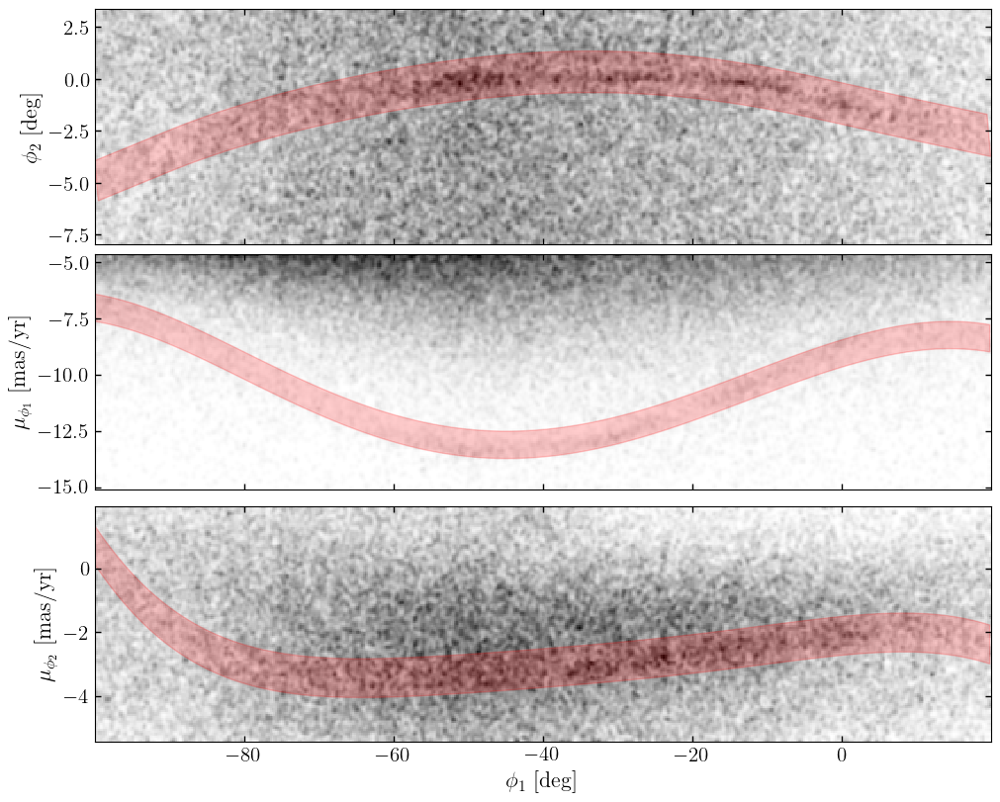

In [9]:
patch_sky = mpl.patches.Polygon(
            o.pawprint.skyprint["stream"].vertices[::50],
            facecolor="r",
            edgecolor="r",
            linewidth=1,
            alpha=0.2
        )

spline_phi2, spline_pm1, spline_pm2, _ = pmsel.from_galstreams()

fig, axes, _ = plot_data_projections(data=run_data, grids=plot_grids,
                      smooth=1, pcolormesh_kwargs={'rasterized':True, 'cmap':'gray_r'});
axes[0].add_patch(patch_sky)
phi1_array = np.arange(-100, 20, 0.2)
axes[1].fill_between(phi1_array, spline_pm1(phi1_array)+np.exp(-0.5), spline_pm1(phi1_array)-np.exp(-0.5), 
                     color='r', alpha=0.2)
axes[2].fill_between(phi1_array, spline_pm2(phi1_array)+np.exp(-0.5), spline_pm2(phi1_array)-np.exp(-0.5), 
                     color='r', alpha=0.2)
# axes[1].add_patch(patch_pm1)
# axes[2].add_patch(patch_pm2)
# plt.savefig('../paper_figures/gd1_data.pdf')
plt.show()

# Background

In [10]:
bkg_pm_knots = jnp.arange(-100, 20 + 1e-3, 30)
bkg_phi1_knots = jnp.arange(-100, 20 + 1e-3, 30)

bkg_model = ModelComponent(
    name="background",
    coord_distributions={
        "phi1": IndependentGMM,
        "phi2": dist.Uniform,
        "pm1": TruncatedNormalSpline,
        "pm2": TruncatedNormalSpline,
    },
    coord_parameters={
        "phi1": {
            "mixing_distribution": (
                dist.Categorical,
                dist.Dirichlet(jnp.ones(len(bkg_phi1_knots))),
            ),
            "locs": bkg_phi1_knots.reshape(1, -1),
            "scales": dist.HalfNormal(15.0),
            "low":  jnp.array([phi1_lim[0]])[:, None],
            "high": jnp.array([phi1_lim[1]])[:, None],                  
        },
        "phi2": {
            "low": phi2_lim[0],
            "high": phi2_lim[1],
        },
        "pm1": {
            "loc_vals": dist.Normal(pm1_lim[1], 1.0).expand([bkg_pm_knots.shape[0]]),
            "scale_vals": dist.HalfNormal(10).expand([bkg_pm_knots.shape[0]]),
            "knots": bkg_pm_knots,
            "x": bkg_data["phi1"],
            "low": pm1_lim[0],
            "high": pm1_lim[1],
            "spline_k": 3,
            "clip_locs": (-5,5),
            "clip_scales": (1, None),
        },
        "pm2": {
            "loc_vals": dist.Normal(pm2_lim[1], 1.0).expand([bkg_pm_knots.shape[0]]),
            "scale_vals": dist.HalfNormal(5).expand([bkg_pm_knots.shape[0]]),
            "knots": bkg_pm_knots,
            "x": bkg_data["phi1"],
            "low": pm2_lim[0],
            "high": pm2_lim[1],
            "spline_k": 3,
            "clip_locs": (pm2_lim[0], pm2_lim[1]),
            "clip_scales": (1e-1, None),
        }
    },
    conditional_data={"pm1": {"x": "phi1"}, 
                      "pm2": {"x": "phi1"}},
)

In [11]:
bkg_init_params = {
    "phi1": {
        "mixing_distribution": jnp.ones(len(bkg_phi1_knots)) / len(bkg_phi1_knots),
        "scales": 15.0
    },
    "phi2": {},
    "pm1": {
        "loc_vals": jnp.full(bkg_pm_knots.shape[0], 0),
        "scale_vals": jnp.full(bkg_pm_knots.shape[0], 5.0),
    },
    "pm2": {
        "loc_vals": jnp.full(bkg_pm_knots.shape[0], -3.0),
        "scale_vals": jnp.full(bkg_pm_knots.shape[0], 3.0),
    }
}

# bkg_init_p = {
#     "ln_N": np.log(len(bkg_data['phi1'])),
#     #"phi1": {'zs': np.array([-3.5, -2.5, -1.5, -0.5, 0.5, 1.5, 2.5, 3.5])+1},
#     "phi1": {'zs': np.zeros(BkgModel.phi1_locs.shape[0]-1)},
#     "phi2": {},
#     "pm1": {
#         "w": np.full_like(BkgModel.pm1_knots, 0.5),
#         "mean1": np.full_like(BkgModel.pm1_knots, 0),
#         "ln_std1": np.full_like(BkgModel.pm1_knots, 1),
#         "mean2": np.full_like(BkgModel.pm1_knots, 5),
#         "ln_std2": np.full_like(BkgModel.pm1_knots, 2)
#     },
#     "pm2": {
#         "w": np.full_like(BkgModel.pm2_knots, 0.5),
#         "mean1": np.full_like(BkgModel.pm2_knots, -2.),
#         "ln_std1": np.full_like(BkgModel.pm2_knots, 1),
#         "mean2": np.full_like(BkgModel.pm2_knots, -3),
#         "ln_std2": np.full_like(BkgModel.pm2_knots, 2)
#     },
# }

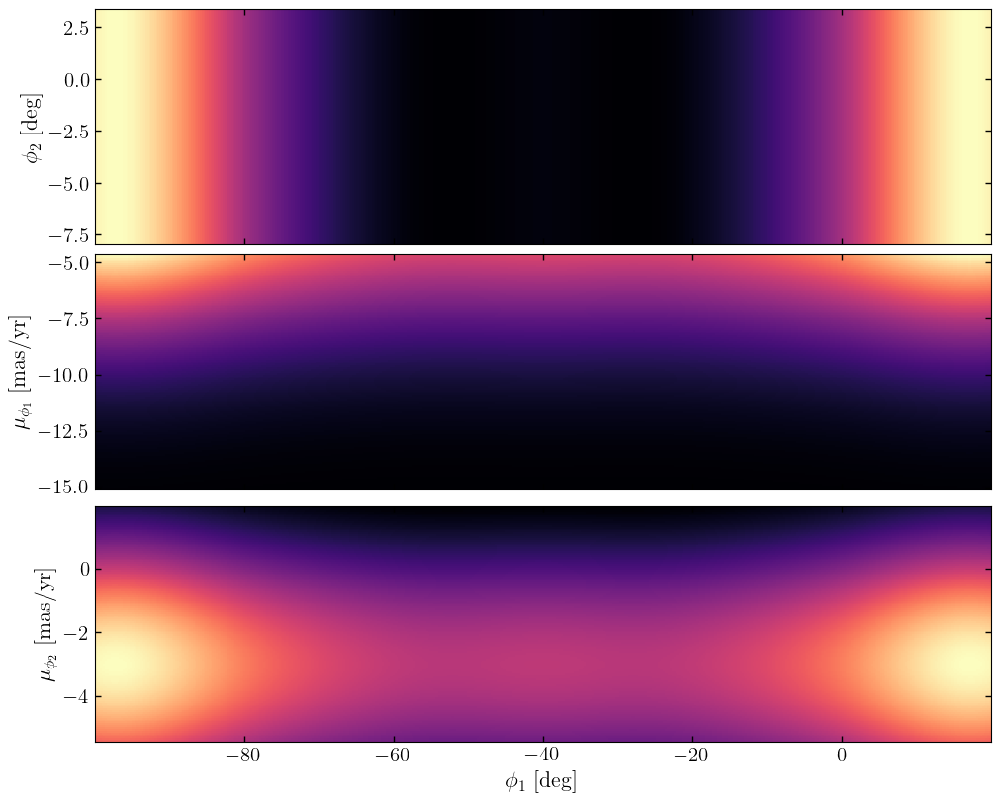

In [12]:
_ = bkg_model.plot_model_projections(pars=bkg_init_params, grids=plot_grids, pcolormesh_kwargs=dict(rasterized=True))

In [13]:
optimizer = numpyro.optim.Adam(1e-2)
guide_bkg = AutoDelta(
    bkg_model, init_loc_fn=numpyro.infer.init_to_value(values=bkg_init_params)
)
MAP_svi_bkg = SVI(bkg_model, guide_bkg, optimizer, Trace_ELBO())

In [14]:
rng_key = jax.random.PRNGKey(12345)
with numpyro.validation_enabled(), jax.debug_nans():
    init_state = MAP_svi_bkg.init(rng_key, init_params=bkg_init_params, data=bkg_data)
    MAP_svi_results_bkg = MAP_svi_bkg.run(
    rng_key=jax.random.PRNGKey(54321), num_steps=1000, init_state=init_state, data=bkg_data,
    )

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:58<00:00, 17.03it/s, init loss: 1639125.7330, avg. loss [951-1000]: 626585.5257]


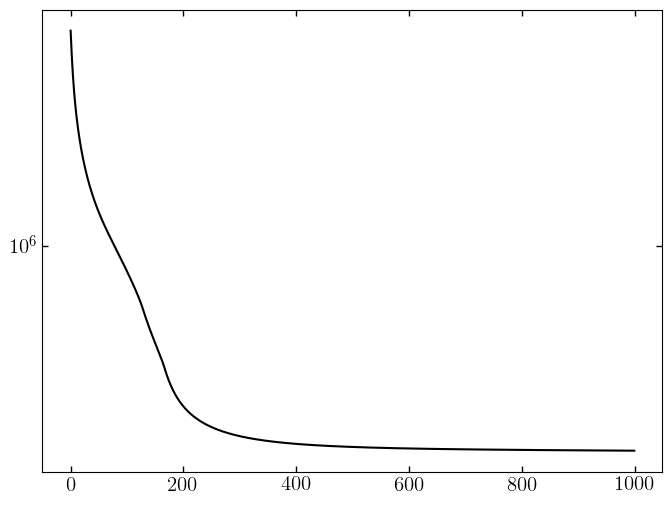

In [15]:
plt.plot(MAP_svi_results_bkg.losses)
plt.yscale("symlog")
# plt.ylim(1e6, 1e7)

pred_dist_bkg = Predictive(guide_bkg, params=MAP_svi_results_bkg.params, num_samples=1)
MAP_p_bkg = pred_dist_bkg(jax.random.PRNGKey(42), data=bkg_data)
MAP_p_bkg = {k: v[0] for k, v in MAP_p_bkg.items()}
MAP_p_bkg_expanded = bkg_model.expand_numpyro_params(MAP_p_bkg)

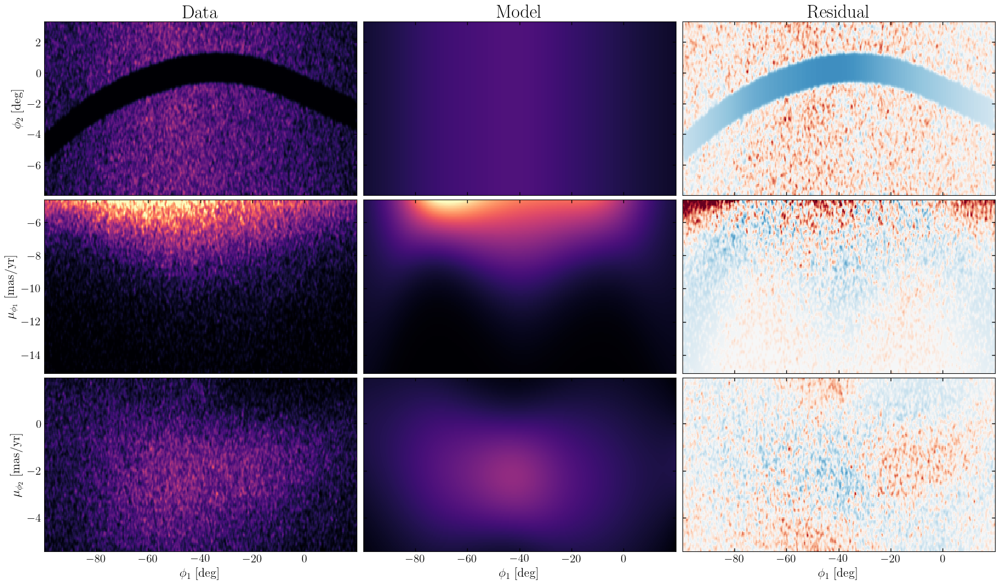

In [16]:
fig, axes = plt.subplots(
    len(bkg_model.coord_names) - 1,
    3,
    figsize=(18, 3.5 * (len(bkg_model.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=bkg_data,
    grids=plot_grids,
    axes=axes[:, 0],
    pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0)
    # coord_names=GD1BackgroundModel.coord_names,
)
bkg_model.plot_model_projections(data=bkg_data, grids=plot_grids, pars=MAP_p_bkg_expanded, axes=axes[:, 1], label=False,
                                     pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0))

bkg_model.plot_residual_projections(
    grids=plot_grids, pars=MAP_p_bkg_expanded,
    data=bkg_data, axes=axes[:, 2], label=False, 
    pcolormesh_kwargs=dict(vmin=-2, vmax=2, cmap='RdBu', rasterized=True)
)
axes[0][0].set_title('Data', fontsize=24)
axes[0][1].set_title('Model', fontsize=24)
axes[0][2].set_title('Residual', fontsize=24)
plt.show()

### Optimization

In [11]:
bkg_opt_pars, bkg_info = background_init.optimize(
    data=bkg_data,
    init_params=bkg_init_p,
    use_bounds=True,
    jaxopt_kwargs=dict(maxiter=4096),
)

background_opt = BkgModel(bkg_opt_pars)
bkg_info

INFO: jaxopt.ZoomLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. crit.): 0.0007299549541605627 Stepsize:1.0  Decrease Error:0.0  Curvature Error:0.0007299549541605627 
INFO: jaxopt.ZoomLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. crit.): 0.0 Stepsize:1.0  Decrease Error:0.0  Curvature Error:0.0 
INFO: jaxopt.ZoomLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. crit.): 0.0 Stepsize:1.0  Decrease Error:0.0  Curvature Error:0.0 
INFO: jaxopt.ZoomLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. crit.): 0.0 Stepsize:1.0  Decrease Error:0.0  Curvature Error:0.0 
INFO: jaxopt.ZoomLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. crit.): 0.0 Stepsize:1.0  Decrease Error:0.0  Curvature Error:0.0 
INFO: jaxopt.ZoomLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. crit.): 0.0 Stepsize:1.0  Decrease Error:0.0  Curvature Error:0.0 
INFO: jaxopt.ZoomLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. cr

LbfgsbState(iter_num=Array(15, dtype=int64, weak_type=True), value=Array(0.91562472, dtype=float64), grad={'ln_N': Array(-4.54729605e-05, dtype=float64), 'phi1': {'zs': Array([ 9.17457823e-05,  9.79874587e-05,  1.17118524e-04,  5.23402531e-05,
       -1.80530749e-04, -2.51173558e-04,  1.80606098e-05,  3.10484486e-04,
       -2.42212507e-04, -4.50064013e-04,  1.45045484e-04, -7.49789901e-05,
       -2.91690415e-04, -1.45065788e-04], dtype=float64)}, 'phi2': {}, 'pm1': {'ln_std1': Array([ 6.73807187e-07, -1.28124023e-04, -3.20641198e-04,  1.59663608e-06,
       -3.02704631e-04, -1.88351262e-04,  3.13361097e-04, -1.69190297e-04,
       -2.76047818e-04,  6.81758113e-05,  1.17904463e-04,  7.88582477e-05,
       -1.12561527e-04], dtype=float64), 'ln_std2': Array([ 6.61144947e-05,  7.08708005e-06, -1.65087978e-04, -4.44930004e-05,
       -1.95925007e-04, -1.87073616e-04,  1.05385606e-04, -1.30689429e-04,
       -2.70010046e-04, -8.12375944e-05, -3.02514074e-05, -6.61218879e-05,
        7.6633

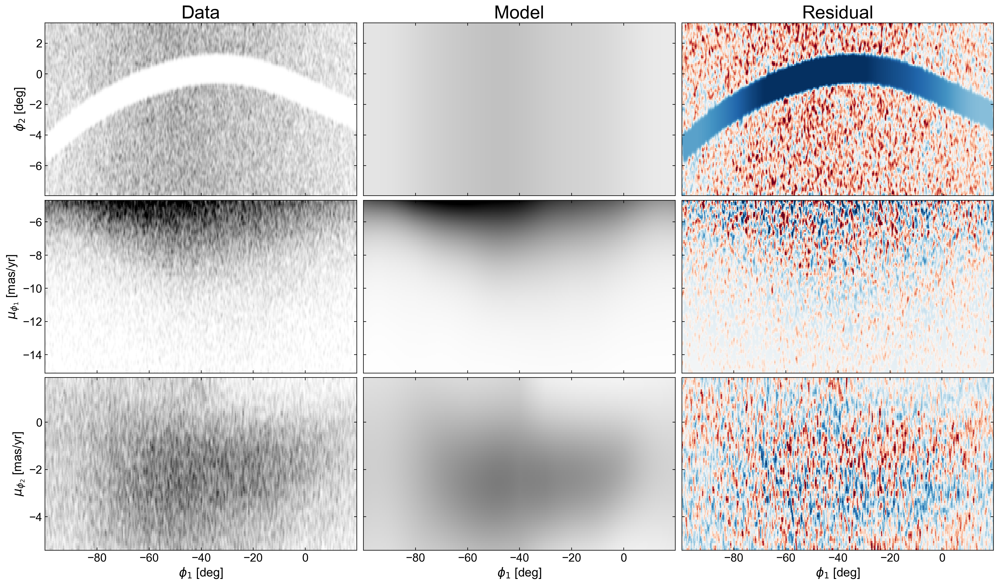

In [12]:
fig, axes = plt.subplots(
    len(background_opt.coord_names) - 1,
    3,
    figsize=(18, 3.5 * (len(background_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=bkg_data,
    grids=BackgroundModel.default_grids,
    axes=axes[:, 0],
    pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0)
    # coord_names=GD1BackgroundModel.coord_names,
)
background_opt.plot_model_projections(axes=axes[:, 1], label=False,
                                     pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0))
background_opt.plot_residual_projections(
    data=bkg_data, axes=axes[:, 2], label=False, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu', rasterized=True)
)
axes[0][0].set_title('Data', fontsize=24)
axes[0][1].set_title('Model', fontsize=24)
axes[0][2].set_title('Residual', fontsize=24)
plt.show()
# fig.savefig('../../paper_figures/background_model.pdf')

# Stream

In [17]:
# TODO: replace this with galstreams initialization
from scipy.stats import binned_statistic
from scipy.interpolate import InterpolatedUnivariateSpline

_phi2_stat = binned_statistic(stream_data["phi1"], stream_data["phi2"], bins=np.linspace(phi1_lim[0], phi1_lim[1], 21))
_phi2_interp = IUS(
    0.5 * (_phi2_stat.bin_edges[:-1] + _phi2_stat.bin_edges[1:]), _phi2_stat.statistic, ext=0, k=1
)

_pm1_stat = binned_statistic(stream_data["phi1"], stream_data["pm1"], bins=np.linspace(phi1_lim[0], phi1_lim[1], 32))
_pm1_interp = IUS(
    0.5 * (_pm1_stat.bin_edges[:-1] + _pm1_stat.bin_edges[1:]), _pm1_stat.statistic, ext=0, k=1
)

_pm2_stat = binned_statistic(stream_data["phi1"], stream_data["pm2"], bins=np.linspace(phi1_lim[0], phi1_lim[1], 32))
_pm2_interp = IUS(
    0.5 * (_pm2_stat.bin_edges[:-1] + _pm2_stat.bin_edges[1:]), _pm2_stat.statistic, ext=0, k=1
)

In [78]:
stream_phi1_knots = jnp.arange(-100.0, 20 + 1e-3, 5)
stream_phi2_knots = jnp.arange(-100.0, 20 + 1e-3, 10)
stream_pm1_knots = jnp.arange(-100.0, 20 + 1e-3, 10)
stream_pm2_knots = jnp.arange(-100.0, 20 + 1e-3, 10)

stream_model = ModelComponent(
    name="stream",
    coord_distributions={
        "phi1": IndependentGMM,
        "phi2": TruncatedNormalSpline,
        "pm1": TruncatedNormalSpline,
        "pm2": TruncatedNormalSpline,
    },
    coord_parameters={
        "phi1": {
            "mixing_distribution": (
                dist.Categorical,
                dist.Dirichlet(jnp.ones(len(stream_phi1_knots))),
            ),
            "locs": stream_phi1_knots.reshape(1, -1),
            "scales": dist.HalfNormal(5.0),
            "low": jnp.array([phi1_lim[0]])[:, None],
            "high": jnp.array([phi1_lim[1]])[:, None],
        },
        "phi2": {
            "loc_vals": dist.Uniform(*phi2_lim).expand([stream_phi2_knots.shape[0]]),
            "scale_vals": dist.HalfNormal(0.5).expand([stream_phi2_knots.shape[0]]),
            "knots": stream_phi2_knots,
            "x": stream_data["phi1"],
            "low": phi2_lim[0],
            "high": phi2_lim[1],
            "spline_k": 3,
            "clip_scales": (1e-1, None),
        },
        "pm1": {
            "loc_vals": dist.Uniform(-15, pm1_lim[1]).expand(
                [stream_pm1_knots.shape[0]]
            ),
            "scale_vals": dist.HalfNormal(0.5).expand([stream_pm1_knots.shape[0]]),
            "knots": stream_pm1_knots,
            "x": stream_data["phi1"],
            "low": pm1_lim[0],
            "high": pm1_lim[1],
            "spline_k": 3,
            "clip_locs": (pm1_lim[0], pm1_lim[1]),
            "clip_scales": (1e-1, None),
        },
        "pm2": {
            "loc_vals": dist.Uniform(-15, pm2_lim[1]).expand(
                [stream_pm2_knots.shape[0]]
            ),
            "scale_vals": dist.HalfNormal(0.5).expand([stream_pm2_knots.shape[0]]),
            "knots": stream_pm2_knots,
            "x": stream_data["phi1"],
            "low": pm2_lim[0],
            "high": pm2_lim[1],
            "spline_k": 3,
            "clip_locs": (pm2_lim[0], pm2_lim[1]),
            "clip_scales": (1e-1, None),
        },
    },
    conditional_data={"phi2": {"x": "phi1"}, "pm1": {"x": "phi1"}, "pm2": {"x": "phi1"}},
)

In [79]:
stream_init_params = {
    "phi1": {
        "mixing_distribution": jnp.ones(len(stream_phi1_knots))
        / len(stream_phi1_knots),
        "scales": 10.0,
    },
    "phi2": {
        "loc_vals": _phi2_interp(stream_phi2_knots),
        "scale_vals": jnp.full(stream_phi2_knots.shape[0], 0.5),
    },
    "pm1": {
        "loc_vals": _pm1_interp(stream_pm1_knots),
        "scale_vals": jnp.full(stream_pm1_knots.shape[0], 0.35),
    },
    "pm2": {
        "loc_vals": _pm2_interp(stream_pm2_knots),
        "scale_vals": jnp.full(stream_pm2_knots.shape[0], 0.35),
    },
}

# stream_init_p = {
#     "ln_N": np.log(len(stream_data['phi1'])),
#     "phi1": {
#         "zs": np.zeros(StreamDensModel.phi1_locs.shape[0]-1)
#     },
#     "phi2": {
#         "mean": _phi2_interp(StreamDensModel.phi2_knots),
#         "ln_std": np.full_like(StreamDensModel.phi2_knots, np.log(inputs[stream]['width']/2))
#     },
#     "pm1": {
#         "mean": _pm1_interp(StreamDensModel.pm1_knots),
#         "ln_std": np.full_like(StreamDensModel.pm1_knots, -0.5)
#     },
#     "pm2": {
#         "mean": _pm2_interp(StreamDensModel.pm2_knots),
#         "ln_std": np.full_like(StreamDensModel.pm2_knots, -0.5)
#     }
# }

# stream_init = StrModel(stream_init_p)

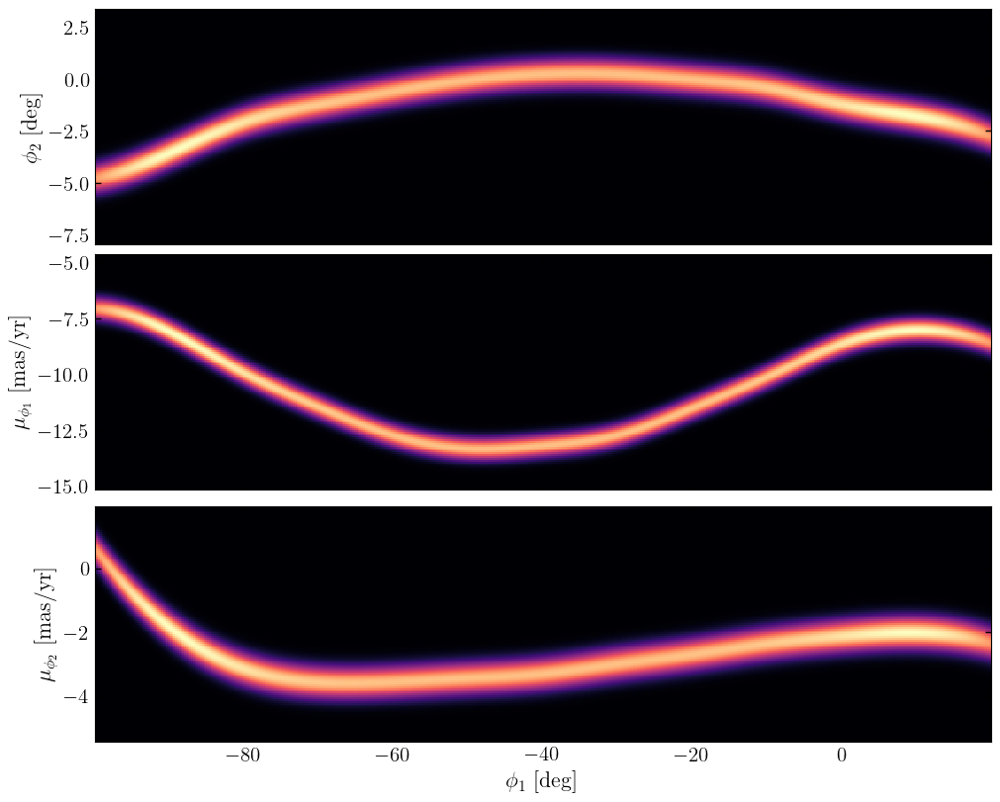

In [80]:
_ = stream_model.plot_model_projections(data=stream_data, pars=stream_init_params, grids=plot_grids)

In [81]:
optimizer = numpyro.optim.Adam(1e-2)
guide_stream = AutoDelta(
    stream_model, init_loc_fn=numpyro.infer.init_to_value(values=stream_init_params)
)
MAP_svi_stream = SVI(stream_model, guide_stream, optimizer, Trace_ELBO())

In [82]:
rng_key = jax.random.PRNGKey(12345)
with numpyro.validation_enabled(), jax.debug_nans():
    init_state = MAP_svi_stream.init(rng_key, init_params=stream_init_params, data=stream_data)
    MAP_svi_results_stream = MAP_svi_stream.run(
    rng_key=jax.random.PRNGKey(54321), num_steps=20000, init_state=init_state, data=stream_data,
    )

100%|███████████████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [01:03<00:00, 315.62it/s, init loss: 104541.3754, avg. loss [19001-20000]: 7959.5272]


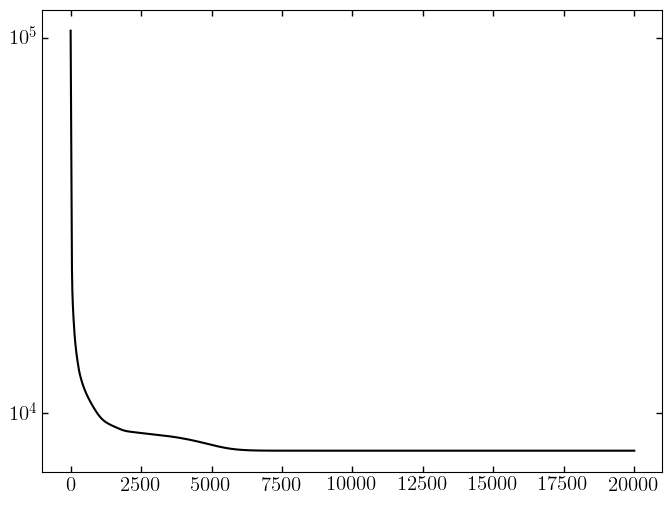

In [83]:
plt.plot(MAP_svi_results_stream.losses)
plt.yscale("symlog")
# plt.ylim(1e4,1e5)

thing = Predictive(guide_stream, params=MAP_svi_results_stream.params, num_samples=1)
MAP_p_stream = thing(jax.random.PRNGKey(42), data=stream_data)
MAP_p_stream = {k: v[0] for k, v in MAP_p_stream.items()}
MAP_p_stream_expanded = bkg_model.expand_numpyro_params(MAP_p_stream)

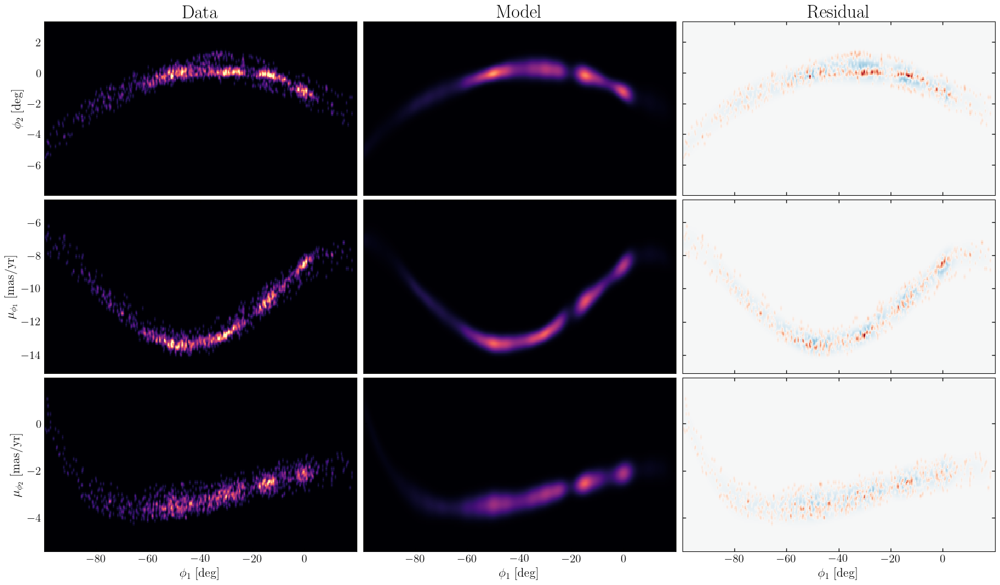

In [84]:
fig, axes = plt.subplots(
    len(stream_model.coord_names) - 1,
    3,
    figsize=(18, 3.5 * (len(stream_model.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=stream_data,
    grids=plot_grids,
    axes=axes[:, 0],
    pcolormesh_kwargs=dict(rasterized=True, vmax=1, vmin=0)
    # coord_names=GD1BackgroundModel.coord_names,
)
stream_model.plot_model_projections(data=stream_data, grids=plot_grids, pars=MAP_p_stream_expanded, axes=axes[:, 1], label=False,
                                     pcolormesh_kwargs=dict(rasterized=True, vmax=1, vmin=0))

stream_model.plot_residual_projections(
    grids=plot_grids, pars=MAP_p_stream_expanded,
    data=stream_data, axes=axes[:, 2], label=False, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu', rasterized=True)
)
axes[0][0].set_title('Data', fontsize=24)
axes[0][1].set_title('Model', fontsize=24)
axes[0][2].set_title('Residual', fontsize=24)
plt.show()

### Stream Sampling

In [134]:
rng_key = jax.random.PRNGKey(42)

fn = jax.tree_util.Partial(StrModel._objective, data=stream_data)
warmup = blackjax.window_adaptation(
    blackjax.nuts,
    fn,
)
rng_key, warmup_key, sample_key = jax.random.split(rng_key, 3)

In [136]:
%%time

(state, parameters), _ = warmup.run(
    warmup_key,
    stream_init_p,
    num_steps=1000
)

2024-06-28 09:31:05.164687: E external/xla/xla/service/slow_operation_alarm.cc:65] 
********************************
[Compiling module jit_scan] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************
2024-06-28 09:43:19.047437: E external/xla/xla/service/slow_operation_alarm.cc:133] The operation took 14m13.89002s

********************************
[Compiling module jit_scan] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************


CPU times: user 18min 17s, sys: 22.5 s, total: 18min 39s
Wall time: 18min 42s


In [137]:
%%time

nuts = blackjax.nuts(fn, **parameters)
kernel = nuts.step
stream_states = inference_loop(sample_key, kernel, state, 10000)

stream_mcmc_samples = stream_states.position

2024-06-28 09:56:50.243088: E external/xla/xla/service/slow_operation_alarm.cc:65] 
********************************
[Compiling module jit_scan] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************
2024-06-28 10:11:44.659468: E external/xla/xla/service/slow_operation_alarm.cc:133] The operation took 16m54.42518s

********************************
[Compiling module jit_scan] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************


CPU times: user 14min 7s, sys: 35.1 s, total: 14min 42s
Wall time: 22min 31s


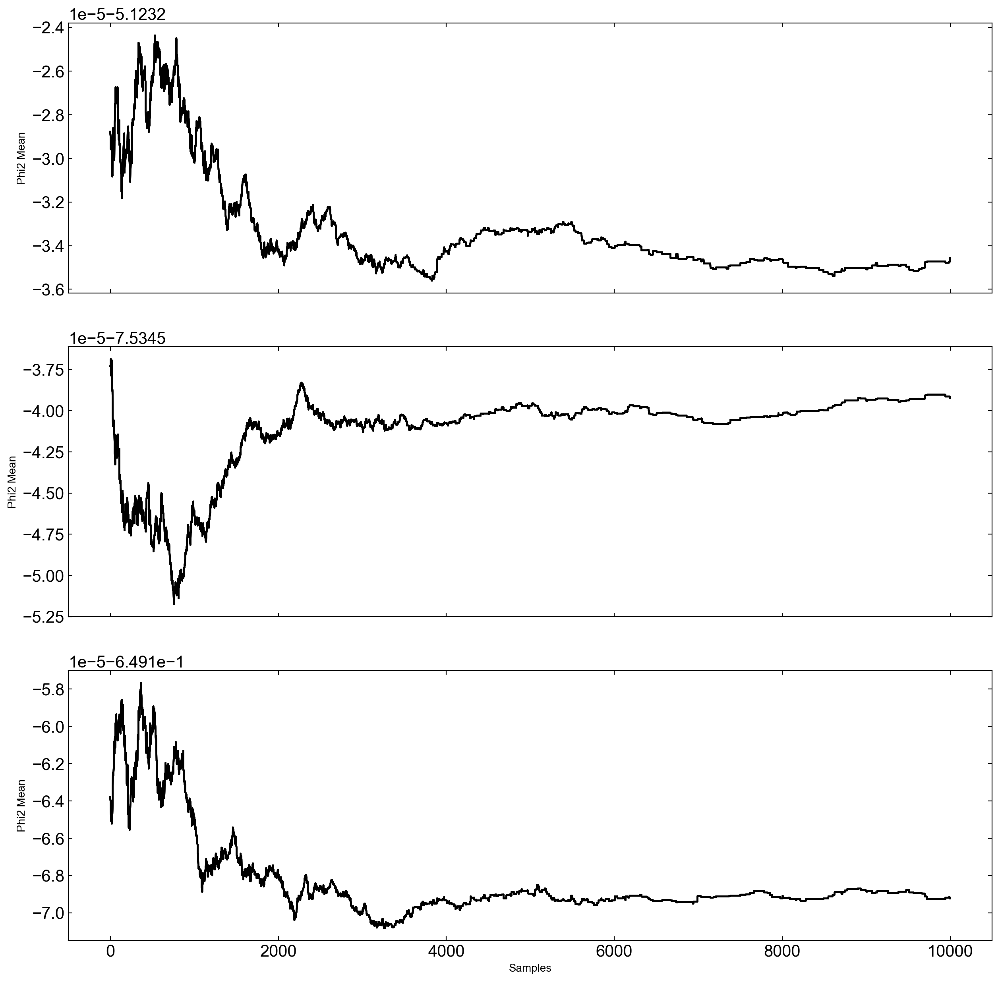

In [215]:
fig, (ax1, ax2, ax3) = plt.subplots(nrows=3, figsize=(15, 15), sharex=True)
for i in range(stream_mcmc_samples["phi2"]['mean'].shape[-1])):
    ax1.plot(stream_mcmc_samples["phi2"]['mean'][:,i], c='k')
    ax2.plot(stream_mcmc_samples["pm1"]['mean'][:,i], c='k')
    ax3.plot(stream_mcmc_samples["pm2"]['mean'][:,i], c='k')

ax3.set_xlabel("Samples")
ax1.set_ylabel("Phi2 Mean")
ax2.set_ylabel("Phi2 Mean")
ax3.set_ylabel("Phi2 Mean")

ax1.set_ylim(-7, 5)
# ax2.set_ylim(-7, 5)
# ax3.set_ylim(-7, 5)

plt.show()

In [13]:
nuts_kernel = NUTS(StrModel.setup_numpyro)
mcmc = MCMC(nuts_kernel, num_warmup=500, num_samples=1000, )
rng_key = jax.random.PRNGKey(0)

mcmc.run(rng_key, data=stream_data, init_params=stream_opt_pars)

### Variational Inference

In [16]:
rng_key = jax.random.PRNGKey(8675309)

guide = AutoNormal(model=StrModel.setup_numpyro)
optimizer = numpyro.optim.Adam(step_size=1e-2) #play with this
svi = SVI(StrModel.setup_numpyro, guide, optimizer, loss=Trace_ELBO())
rng_key, rng_subkey = jax.random.split(key=rng_key)
svi_result = svi.run(
    rng_subkey,
    10_000,
    data=stream_data,
    init_params=stream_init_p
)

100%|█████████████████████████████████████████████████████████████████████████| 10000/10000 [00:24<00:00, 402.88it/s, init loss: 20220551.7728, avg. loss [9501-10000]: -522.3230]


In [17]:
params = svi_result.params
posterior_samples = guide.sample_posterior(jax.random.PRNGKey(1), params, sample_shape=(10000,))

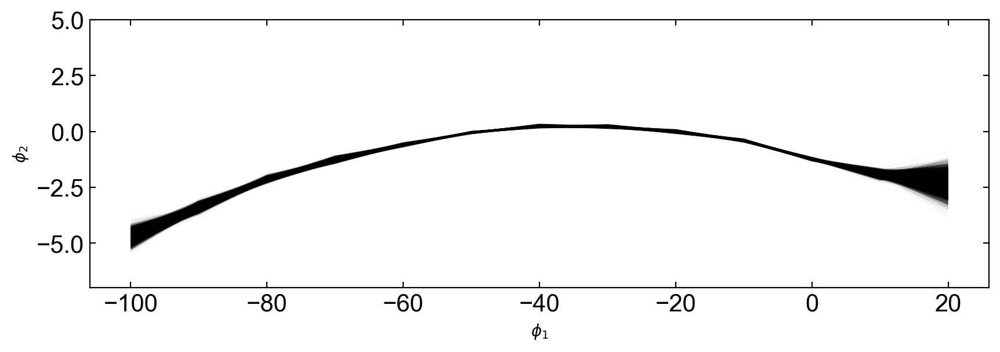

In [18]:
plt.figure(figsize=(10,3))
plt.plot(np.repeat(StrModel.phi2_knots.reshape(1,13), 10000, axis=0).T, posterior_samples['stream-phi2-mean'].T, 
         c='k', lw=0.1, alpha=0.2)
plt.ylim(-7, 5)
plt.xlabel(r'$\phi_1$') ; plt.ylabel(r'$\phi_2$')
plt.show()

### Stream Optimization

In [15]:
stream_opt_pars, info = stream_init.optimize(
    data=stream_data, init_params=stream_init_p, use_bounds=True, jaxopt_kwargs=dict(maxiter=4096),
)

stream_opt = StrModel(stream_opt_pars)
info

INFO: jaxopt.ZoomLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. crit.): 0.009671128100692872 Stepsize:1.0  Decrease Error:0.0  Curvature Error:0.009671128100692872 
INFO: jaxopt.ZoomLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. crit.): 21.82352957050671 Stepsize:1.0  Decrease Error:3.9719794354172424  Curvature Error:21.82352957050671 
INFO: jaxopt.ZoomLineSearch: Iter: 2 Minimum Decrease & Curvature Errors (stop. crit.): 0.0 Stepsize:0.22457571470165588  Decrease Error:0.0  Curvature Error:0.0 
INFO: jaxopt.ZoomLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. crit.): 0.0 Stepsize:0.33686357205248385  Decrease Error:0.0  Curvature Error:0.0 
INFO: jaxopt.ZoomLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. crit.): 0.0 Stepsize:0.5052953580787258  Decrease Error:0.0  Curvature Error:0.0 
INFO: jaxopt.ZoomLineSearch: Iter: 1 Minimum Decrease & Curvature Errors (stop. crit.): 0.0 Stepsize:0.7579430371180887  Decrease Error:0.0  

LbfgsbState(iter_num=Array(94, dtype=int64, weak_type=True), value=Array(-0.66561482, dtype=float64), grad={'ln_N': Array(-2.99760217e-15, dtype=float64), 'phi1': {'zs': Array([ 3.55679028e-05,  7.25557809e-05,  2.95759794e-04,  4.37320063e-04,
        8.91074564e-05, -2.71540853e-04, -6.39073358e-04, -7.64690105e-05,
        2.28631607e-04,  7.16680566e-05,  1.69178441e-05, -9.60130398e-05,
        3.88366813e-04,  6.50262521e-04, -2.86224198e-04, -1.52808842e-04,
       -1.78709409e-04, -1.59793946e-04,  1.73690012e-04,  7.29822609e-04,
        7.49958038e-05,  4.00370250e-05,  1.28939141e-04, -5.31291409e-04,
        1.66426284e-05,  4.98358405e-06, -3.60951626e-04,  1.85552546e-04,
        2.96059831e-04, -9.73152626e-05, -1.50415187e-04, -4.65599427e-05],      dtype=float64)}, 'phi2': {'ln_std': Array([ 4.43093351e-04,  4.05585190e-05, -5.62887741e-05, -1.70429835e-05,
       -5.56446427e-04, -8.11554880e-05, -5.16307016e-04, -4.73944110e-06,
        1.68845460e-04,  9.65861995e-0

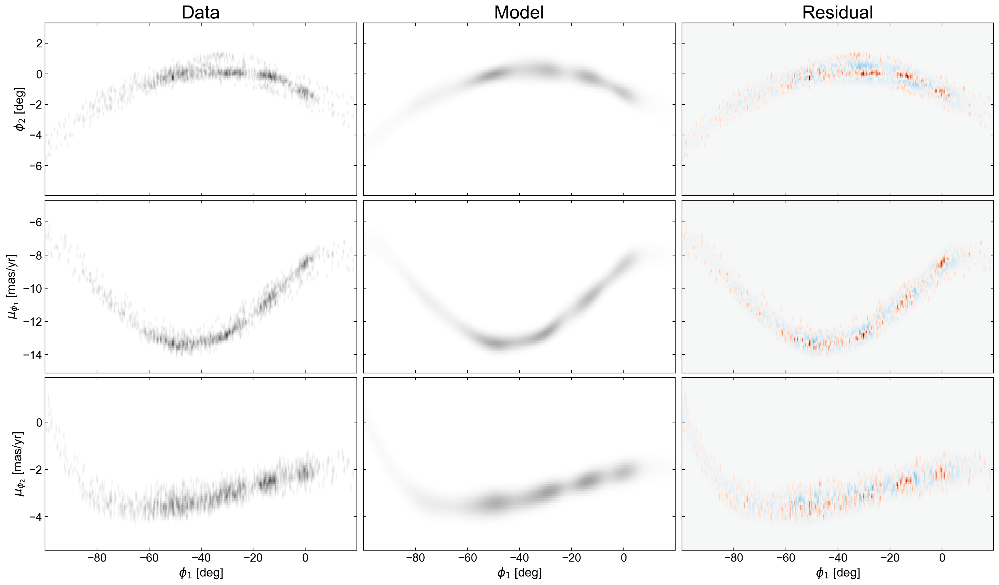

In [20]:
fig, axes = plt.subplots(
    len(stream_opt.coord_names) - 1,
    3, 
    figsize=(18, 3.5 * (len(stream_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=stream_data,
    grids=stream_opt.default_grids,
    axes=axes[:, 0],
    pcolormesh_kwargs=dict(rasterized=True, vmin=0, vmax=2)
)
stream_opt.plot_model_projections(axes=axes[:, 1], label=False, 
                                  pcolormesh_kwargs=dict(rasterized=True,vmin=0, vmax=2))
stream_opt.plot_residual_projections(
    data=stream_data, axes=axes[:, 2], label=False,
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu', rasterized=True)
)
axes[0][0].set_title('Data', fontsize=24)
axes[0][1].set_title('Model', fontsize=24)
axes[0][2].set_title('Residual', fontsize=24)
plt.show()
# fig.savefig('../paper_figures/stream_model.pdf')

# Mixture of Stream + Background (no off-track)

In [91]:
bkg_model = ModelComponent(
    name="background",
    coord_distributions={
        "phi1": IndependentGMM,
        "phi2": dist.Uniform,
        "pm1": TruncatedNormalSpline,
        "pm2": TruncatedNormalSpline,
    },
    coord_parameters={
        "phi1": {
            "mixing_distribution": (
                dist.Categorical,
                dist.Dirichlet(jnp.ones(len(bkg_phi1_knots))),
            ),
            "locs": bkg_phi1_knots.reshape(1, -1),
            "scales": dist.HalfNormal(15.0),
            "low":  jnp.array([phi1_lim[0]])[:, None],
            "high": jnp.array([phi1_lim[1]])[:, None],                  
        },
        "phi2": {
            "low": phi2_lim[0],
            "high": phi2_lim[1],
        },
        "pm1": {
            "loc_vals": dist.Normal(pm1_lim[1], 1.0).expand([bkg_pm_knots.shape[0]]),
            "scale_vals": dist.HalfNormal(10).expand([bkg_pm_knots.shape[0]]),
            "knots": bkg_pm_knots,
            "x": run_data["phi1"],
            "low": pm1_lim[0],
            "high": pm1_lim[1],
            "spline_k": 3,
            "clip_locs": (-5,5),
            "clip_scales": (1, None),
        },
        "pm2": {
            "loc_vals": dist.Normal(pm2_lim[1], 1.0).expand([bkg_pm_knots.shape[0]]),
            "scale_vals": dist.HalfNormal(5).expand([bkg_pm_knots.shape[0]]),
            "knots": bkg_pm_knots,
            "x": run_data["phi1"],
            "low": pm2_lim[0],
            "high": pm2_lim[1],
            "spline_k": 3,
            "clip_locs": (pm2_lim[0], pm2_lim[1]),
            "clip_scales": (1e-1, None),
        }
    },
    conditional_data={"pm1": {"x": "phi1"}, 
                      "pm2": {"x": "phi1"}},
)

stream_model = ModelComponent(
    name="stream",
    coord_distributions={
        "phi1": IndependentGMM,
        "phi2": TruncatedNormalSpline,
        "pm1": TruncatedNormalSpline,
        "pm2": TruncatedNormalSpline,
    },
    coord_parameters={
        "phi1": {
            "mixing_distribution": (
                dist.Categorical,
                dist.Dirichlet(jnp.ones(len(stream_phi1_knots))),
            ),
            "locs": stream_phi1_knots.reshape(1, -1),
            "scales": dist.HalfNormal(5.0),
            "low": jnp.array([phi1_lim[0]])[:, None],
            "high": jnp.array([phi1_lim[1]])[:, None],
        },
        "phi2": {
            "loc_vals": dist.Uniform(*phi2_lim).expand([stream_phi2_knots.shape[0]]),
            "scale_vals": dist.HalfNormal(0.5).expand([stream_phi2_knots.shape[0]]),
            "knots": stream_phi2_knots,
            "x": run_data["phi1"],
            "low": phi2_lim[0],
            "high": phi2_lim[1],
            "spline_k": 3,
            "clip_scales": (1e-1, None),
        },
        "pm1": {
            "loc_vals": dist.Uniform(-15, pm1_lim[1]).expand(
                [stream_pm1_knots.shape[0]]
            ),
            "scale_vals": dist.HalfNormal(0.5).expand([stream_pm1_knots.shape[0]]),
            "knots": stream_pm1_knots,
            "x": run_data["phi1"],
            "low": pm1_lim[0],
            "high": pm1_lim[1],
            "spline_k": 3,
            "clip_locs": (pm1_lim[0], pm1_lim[1]),
            "clip_scales": (1e-1, None),
        },
        "pm2": {
            "loc_vals": dist.Uniform(-15, pm2_lim[1]).expand(
                [stream_pm2_knots.shape[0]]
            ),
            "scale_vals": dist.HalfNormal(0.5).expand([stream_pm2_knots.shape[0]]),
            "knots": stream_pm2_knots,
            "x": run_data["phi1"],
            "low": pm2_lim[0],
            "high": pm2_lim[1],
            "spline_k": 3,
            "clip_locs": (pm2_lim[0], pm2_lim[1]),
            "clip_scales": (1e-1, None),
        },
    },
    conditional_data={"phi2": {"x": "phi1"}, "pm1": {"x": "phi1"}, "pm2": {"x": "phi1"}},
)

In [110]:
dist.HalfNormal(0.5).expand([stream_pm2_knots.shape[0]])

In [92]:
stream_bkg_mm = ComponentMixtureModel(
    dist.Dirichlet(jnp.array([1.0, 1.0])), components=[bkg_model, stream_model]
)

In [93]:
f_stream = np.around(len(stream_data_)/len(run_data_), 3)
print(f_stream)

0.02


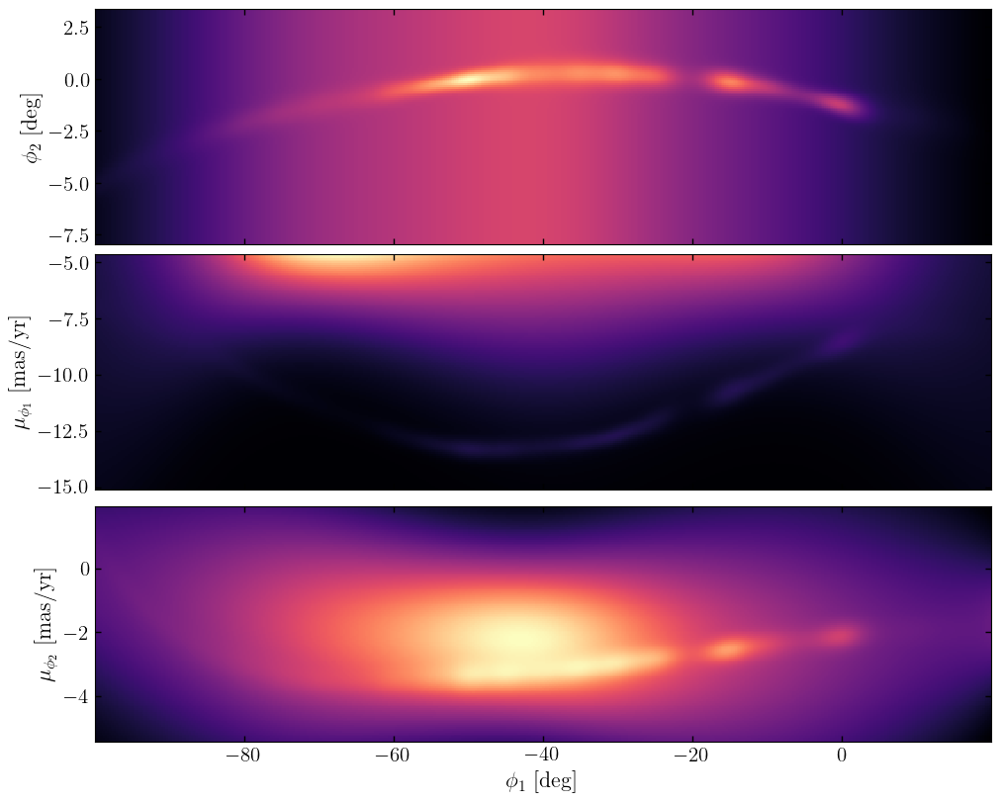

In [94]:
init_params = {"background": MAP_p_bkg_expanded, "stream": MAP_p_stream_expanded}
packed_params = stream_bkg_mm.pack_params(init_params)
packed_params["mixture-probs"] = jnp.array([1-f_stream, f_stream])
packed_params["mixture"] = jnp.stack([v for v in run_data.values()], axis=-1)

_ = stream_bkg_mm.plot_model_projections(data=run_data, pars=packed_params, grids=plot_grids)

In [95]:
optimizer = numpyro.optim.Adam(1e-2)
guide_no_off = AutoDelta(
    stream_bkg_mm, init_loc_fn=numpyro.infer.init_to_value(values=packed_params)
)
MAP_svi_no_off = SVI(stream_bkg_mm, guide_no_off, optimizer, Trace_ELBO())

In [96]:
rng_key = jax.random.PRNGKey(12345)
with numpyro.validation_enabled(), jax.debug_nans():
    init_state = MAP_svi_no_off.init(rng_key, init_params=packed_params, data=run_data)
    MAP_svi_results_no_off = MAP_svi_no_off.run(
    rng_key=jax.random.PRNGKey(54321), num_steps=1500, init_state=init_state, data=run_data
    )

100%|██████████████████████████████████████████████████████████████████████████████████████████████████| 1500/1500 [04:26<00:00,  5.62it/s, init loss: 772963.7174, avg. loss [1426-1500]: 768707.2476]


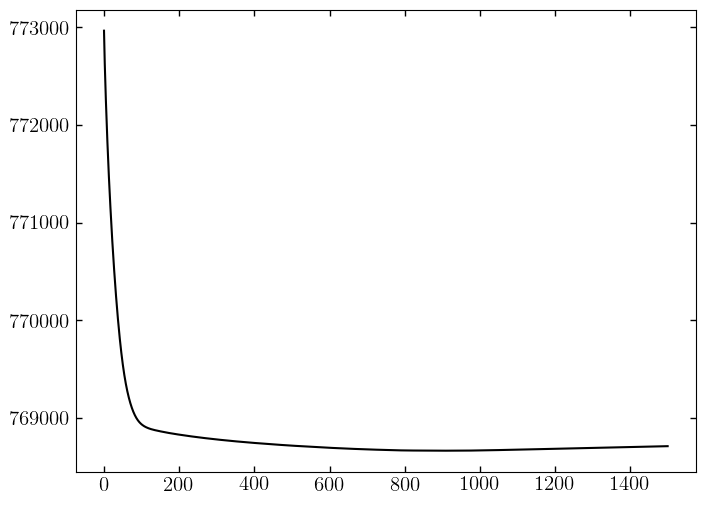

In [98]:
plt.plot(MAP_svi_results_no_off.losses)
# plt.yscale("symlog")
# plt.ylim(1.06957e4,1.0696e4)

pred_dist = Predictive(guide_no_off, params=MAP_svi_results_no_off.params, num_samples=1)
MAP_p_no_off = pred_dist(jax.random.PRNGKey(42), data=run_data)
MAP_p_no_off = {k: v[0] for k, v in MAP_p_no_off.items()}
MAP_p_no_off_expanded = stream_bkg_mm.expand_numpyro_params(MAP_p_no_off)

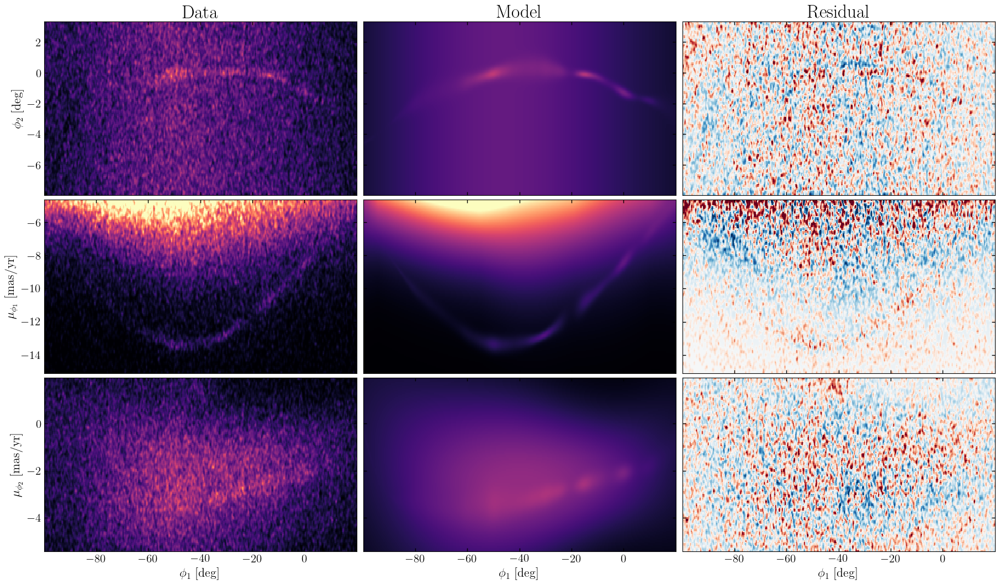

In [99]:
fig, axes = plt.subplots(
    len(stream_bkg_mm.coord_names) - 1,
    3,
    figsize=(18, 3.5 * (len(stream_bkg_mm.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=run_data,
    grids=plot_grids,
    axes=axes[:, 0],
    pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0)
    # coord_names=GD1BackgroundModel.coord_names,
)
stream_bkg_mm.plot_model_projections(data=run_data, grids=plot_grids, pars=MAP_p_no_off_expanded, axes=axes[:, 1], label=False,
                                     pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0))
stream_bkg_mm.plot_residual_projections(
    grids=plot_grids, pars=MAP_p_no_off_expanded,
    data=run_data, axes=axes[:, 2], label=False, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu', rasterized=True)
)
axes[0][0].set_title('Data', fontsize=24)
axes[0][1].set_title('Model', fontsize=24)
axes[0][2].set_title('Residual', fontsize=24)
plt.show()

In [154]:
stream_comp, bkg_comp = stream_bkg_mm.components[0], stream_bkg_mm.components[1]
stream_ll = stream_comp.ln_number_density(run_data)
bkg_ll = bkg_comp.ln_number_density(run_data)
print(stream_ll.sum(), bkg_ll.sum())

AttributeError: 'ModelComponent' object has no attribute 'ln_number_density'

In [46]:
# with open('../data/mix_opt_params.pkl', 'wb') as output:
#     pickle.dump(mix_opt_pars, output)

In [30]:
stream_comp, bkg_comp = mix_opt.components[0], mix_opt.components[1]
stream_ll = stream_comp.ln_number_density(run_data)
bkg_ll = bkg_comp.ln_number_density(run_data)
print(stream_ll.sum(), bkg_ll.sum())

-22396108.43720873 40446.19505393244


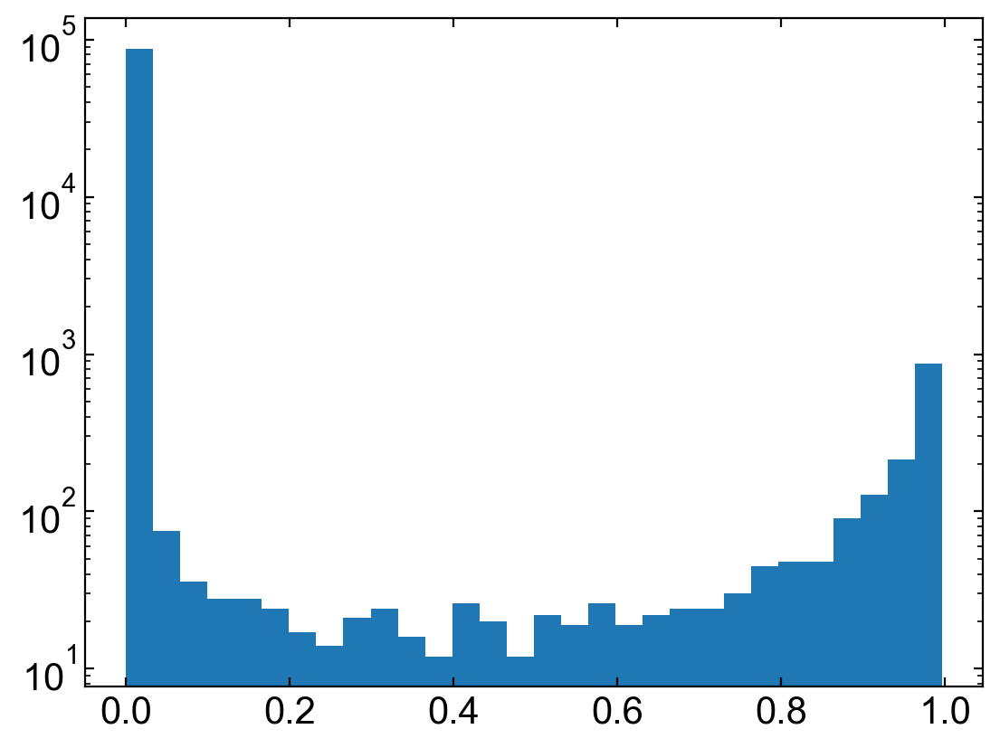

In [31]:
memb_prob = np.exp(stream_ll - np.logaddexp(stream_ll,bkg_ll))
plt.hist(memb_prob, bins=30)
plt.yscale('log')

In [32]:
(memb_prob > 0.5).sum()

1625

Text(0, 0.5, '$\\phi_2$')

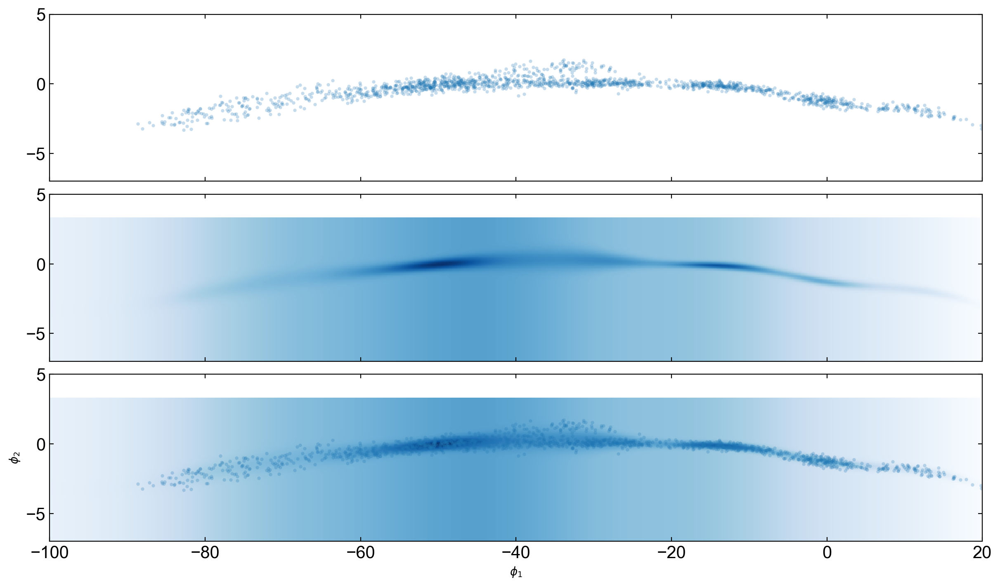

In [34]:
_grids, ln_dens = mix_opt.evaluate_on_2d_grids()

fig, axes = plt.subplots(3, 1, figsize=(12, 7), constrained_layout=True, sharex=True, sharey=True)
for ax in [axes[0], axes[2]]:
    ax.plot(
        run_data['phi1'][memb_prob>0.5],
        run_data['phi2'][memb_prob>0.5],
        marker="o",
        markeredgewidth=0,
        markersize=3.0,
        ls="none",
        alpha=0.25,
    )
    
for ax in [axes[1], axes[2]]:
    ax.pcolormesh(
        _grids[('phi1', 'phi2')][0],
        _grids[('phi1', 'phi2')][1],
        np.exp(ln_dens[('phi1', 'phi2')]),
        cmap="Blues",
        shading='auto'
    )
ax.set_xlim(-100, 20)
ax.set_ylim(-7, 5)

ax.set_xlabel(r"$\phi_1$")
ax.set_ylabel(r"$\phi_2$")

In [212]:
jnp.array([2.0,0.5])[:, None].shape

(2, 1)

# Off-track

**Note: Code below here is currently failing and is a mess! I'm working on it...**

We also include an "off-track" model that uses the 2D grid of Normals for the sky distribution but uses the same $\mu_{\phi_i}$ tracks as the stream model.

In [213]:
offtrack_phi1_dx = 4.0
offtrack_phi2_dx = 1.0
offtrack_phi12_locs = jnp.stack(
    jnp.meshgrid(
        jnp.arange(phi1_lim[0]+offtrack_phi1_dx, 
                   phi1_lim[1]-offtrack_phi1_dx/2 + 1e-3, #factor of two added by hand to make sure the high phi1 edge is properly included
                   offtrack_phi1_dx),
        jnp.arange(phi2_lim[0]+offtrack_phi2_dx, 
                   phi2_lim[1]-offtrack_phi2_dx + 1e-3, 
                   offtrack_phi2_dx),
    ),
    axis=-1,
).reshape(-1, 2)

# # Remove nodes in areas we don't have data:
# offtrack_node_mask = np.ones(offtrack_phi12_locs.shape[0], dtype=bool)
# pt1 = (-55, 0)
# pt2 = (-40, 2)
# m = (pt2[1] - pt1[1]) / (pt2[0] - pt1[0])
# offtrack_node_mask &= offtrack_phi12_locs[:, 1] < (
#     m * (offtrack_phi12_locs[:, 0] - pt1[0]) + pt1[1]
# )
# offtrack_node_mask &= offtrack_phi12_locs[:, 1] > (
#     m * (offtrack_phi12_locs[:, 0] - pt1[0]) + pt1[1] - 4.0
# )

# offtrack_phi12_locs = offtrack_phi12_locs[offtrack_node_mask]
print(f"{offtrack_phi12_locs.shape[0]} nodes for offtrack model")

offtrack_model = ModelComponent(
    name="offtrack",
    coord_distributions={
        ("phi1", "phi2"): IndependentGMM,
        "pm1": stream_model.coord_distributions["pm1"],
        "pm2": stream_model.coord_distributions["pm2"],
    },
    coord_parameters={
        ("phi1", "phi2"): {
            "mixing_distribution": (
                dist.Categorical,
                dist.Dirichlet(jnp.full(offtrack_phi12_locs.shape[0], 0.5)),
            ),
            "locs": offtrack_phi12_locs.T,
            "scales":
                # dist.HalfNormal(jnp.array([offtrack_phi1_dx, offtrack_phi2_dx])[:, None]).expand(offtrack_phi12_locs.T.shape), 
                dist.TruncatedNormal(loc=jnp.array([2.0,0.5])[:, None], scale=0.5, low=jnp.array([2.0, 0.5])[:, None]).expand(offtrack_phi12_locs.T.shape),
            "low": jnp.array([phi1_lim[0], phi2_lim[0]])[:, None],
            "high": jnp.array([phi1_lim[1], phi2_lim[1]])[:, None],
        },
        # We don't need to define the parameters here, as they are the same as for the
        # stream model - this will be handled below when we combine the components into
        # a mixture model
        "pm1": stream_model.coord_parameters["pm1"],
        "pm2": stream_model.coord_parameters["pm2"],
    },
    conditional_data={"pm1": {"x": "phi1"}, "pm2": {"x": "phi1"}},
)

290 nodes for offtrack model


In [214]:
# _init_prob = (
#     np.exp(-0.5 * (offtrack_phi12_locs[:, 0] - -35) ** 2 / 4**2)
#     * np.exp(-0.5 * (offtrack_phi12_locs[:, 1] - 1.5) ** 2 / 0.5**2)
#     + 1e-5
# )
_init_prob = jnp.ones(len(offtrack_phi12_locs))
_init_prob /= _init_prob.sum()

offtrack_init_params = {
    ("phi1", "phi2"): {
        "mixing_distribution": _init_prob,
        "scales": jnp.array([[4.0, 1.0]] * len(offtrack_phi12_locs)).T,
    },
    "pm1": stream_init_params["pm1"],
    "pm2": stream_init_params["pm2"],
}

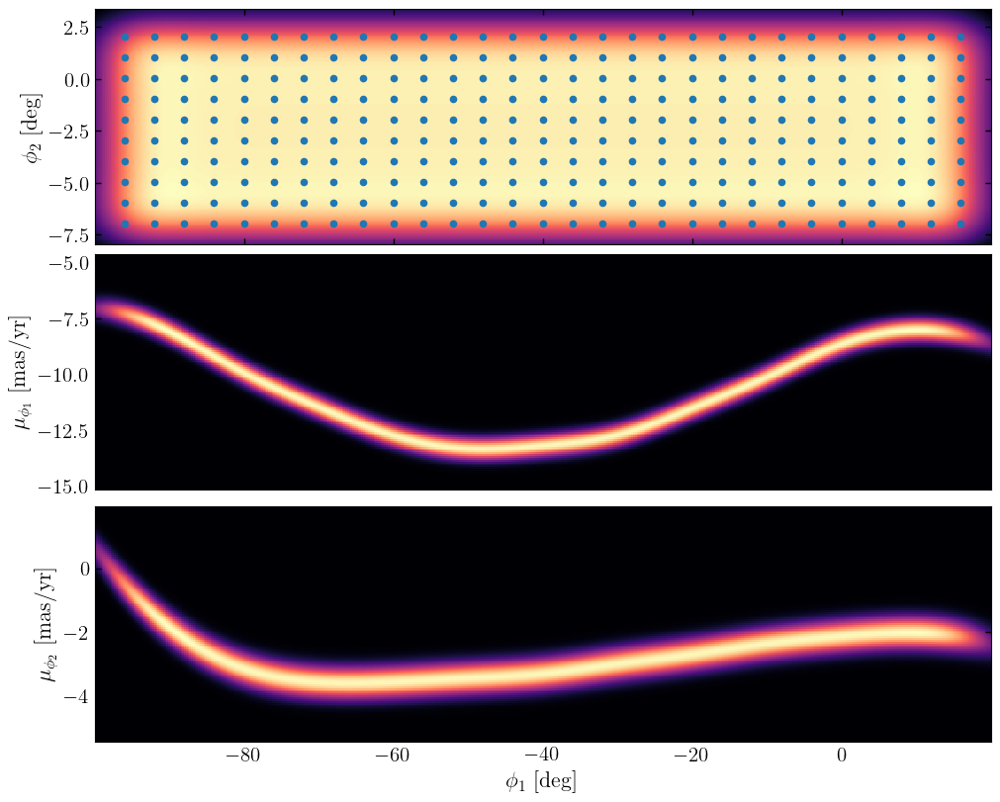

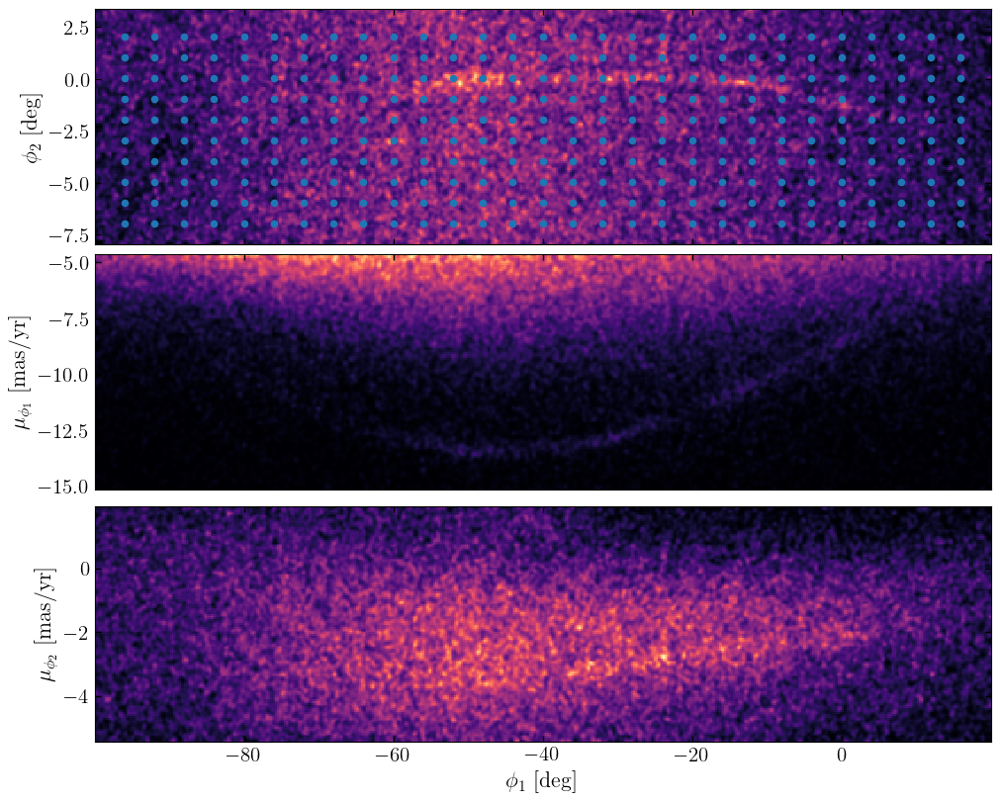

In [215]:
fig, axes, _ = offtrack_model.plot_model_projections(pars=offtrack_init_params, grids=plot_grids)
axes[0].scatter(
    offtrack_phi12_locs[:, 0], offtrack_phi12_locs[:, 1], color="tab:blue", s=20
)

fig, axes, _ = plot_data_projections(data=run_data, grids=plot_grids)
axes[0].scatter(
    offtrack_phi12_locs[:, 0], offtrack_phi12_locs[:, 1], color="tab:blue", s=20
)

In [216]:
mm = ComponentMixtureModel(
    dist.Dirichlet(jnp.array([1.0, 1.0, 2.0])),
    components=[bkg_model, stream_model, offtrack_model],
    tied_coordinates={"offtrack": {"pm1": "stream", "pm2": "stream"}},
)

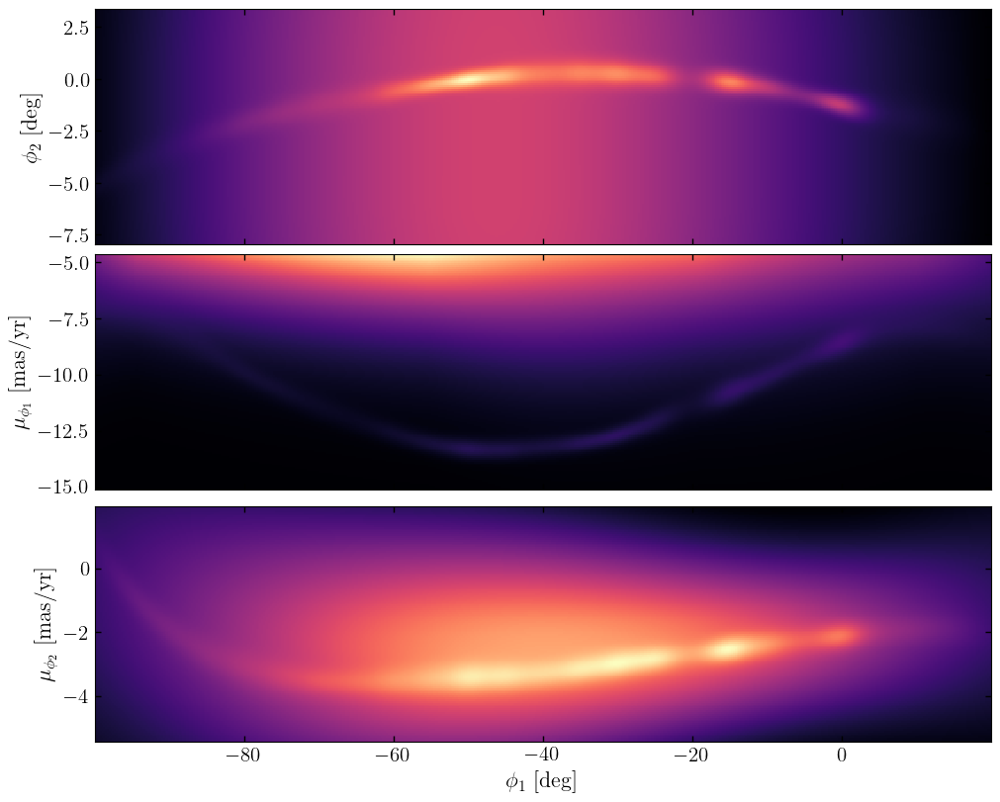

In [217]:
mm_init_params = {
    "background": MAP_p_no_off_expanded["background"],
    "stream": MAP_p_stream_expanded, # take from stream model rather than stream+background so that it doesn't have the spur
    "offtrack": offtrack_init_params,
}
mm_packed_params = mm.pack_params(mm_init_params)
mm_packed_params["mixture-probs"] = jnp.array([0.97, 0.02, 0.01])
mm_packed_params["mixture"] = jnp.stack([v for v in run_data.values()], axis=-1)

_ = mm.plot_model_projections(mm_packed_params, grids=plot_grids)

In [218]:
# TODO: do we need to pass in unconstrained parameter values?
# optimizer = numpyro.optim.Adam(1e-3, eps=1e-11)
optimizer = numpyro.optim.ClippedAdam(1e-2, eps=1e-10)
guide = AutoNormal(mm, init_loc_fn=numpyro.infer.init_to_value(values=mm_packed_params))
MAP_svi = SVI(mm, guide, optimizer, Trace_ELBO())

In [219]:
keys = jax.random.split(jax.random.PRNGKey(808), num=2)
with numpyro.validation_enabled(), jax.debug_nans():
    init_state = MAP_svi.init(keys[0], init_params=mm_packed_params, data=run_data)
    MAP_svi_results = MAP_svi.run(
        keys[1], 1000, init_state=init_state, data=run_data
    )

100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [06:10<00:00,  2.70it/s, init loss: 774505.5847, avg. loss [951-1000]: 769189.7730]


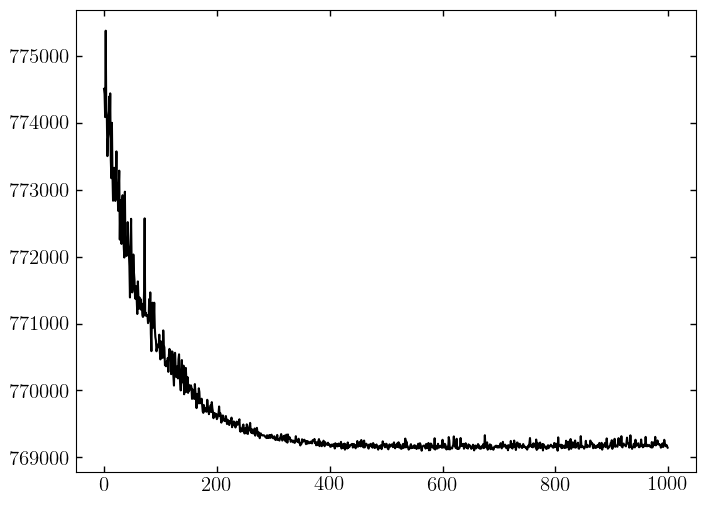

In [220]:
plt.plot(MAP_svi_results.losses)
# plt.yscale("symlog")
# plt.ylim(1.06957e4,1.0696e4)

pred_dist = Predictive(guide, params=MAP_svi_results.params, num_samples=1)
MAP_p = pred_dist(jax.random.PRNGKey(42), data=run_data)
MAP_p = {k: v[0] for k, v in MAP_p.items()}
MAP_p_expanded = mm.expand_numpyro_params(MAP_p)

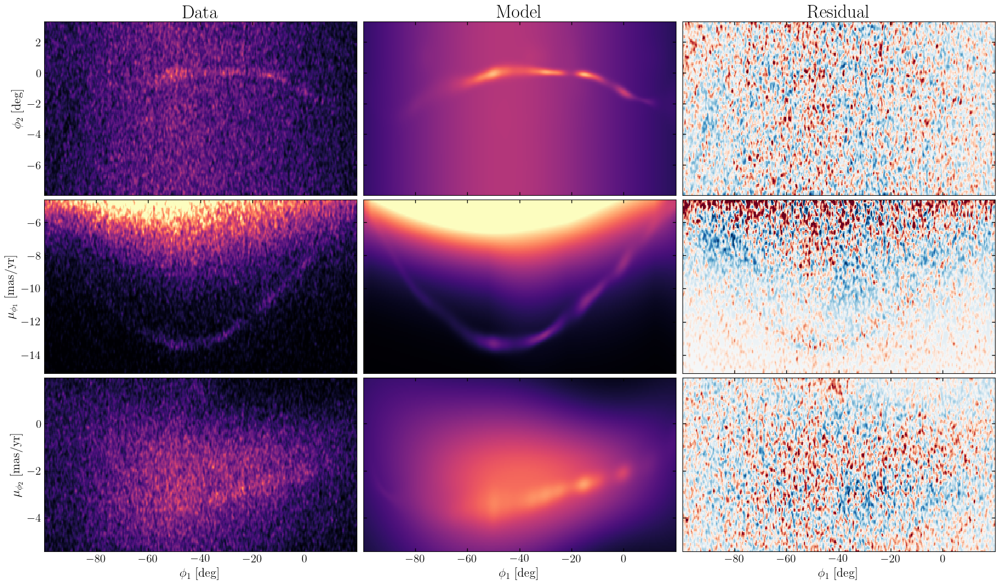

In [221]:
fig, axes = plt.subplots(
    len(mm.coord_names) - 1,
    3,
    figsize=(18, 3.5 * (len(mm.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=run_data,
    grids=plot_grids,
    axes=axes[:, 0],
    pcolormesh_kwargs=dict(rasterized=True, vmax=5, vmin=0)
    # coord_names=GD1BackgroundModel.coord_names,
)
mm.plot_model_projections(data=run_data, grids=plot_grids, pars=MAP_p_expanded, axes=axes[:, 1], label=False,
                                     pcolormesh_kwargs=dict(rasterized=True, vmax=3, vmin=0))
mm.plot_residual_projections(
    grids=plot_grids, pars=MAP_p_expanded,
    data=run_data, axes=axes[:, 2], label=False, 
    pcolormesh_kwargs=dict(vmin=-1, vmax=1, cmap='RdBu', rasterized=True)
)
axes[0][0].set_title('Data', fontsize=24)
axes[0][1].set_title('Model', fontsize=24)
axes[0][2].set_title('Residual', fontsize=24)
plt.show()

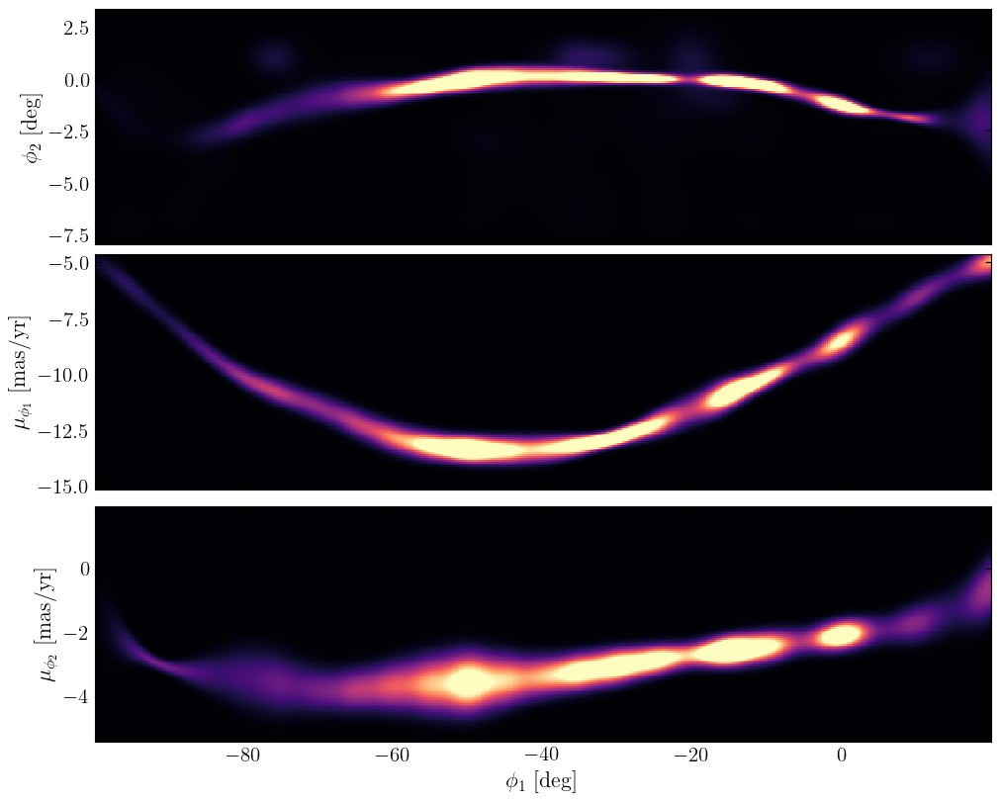

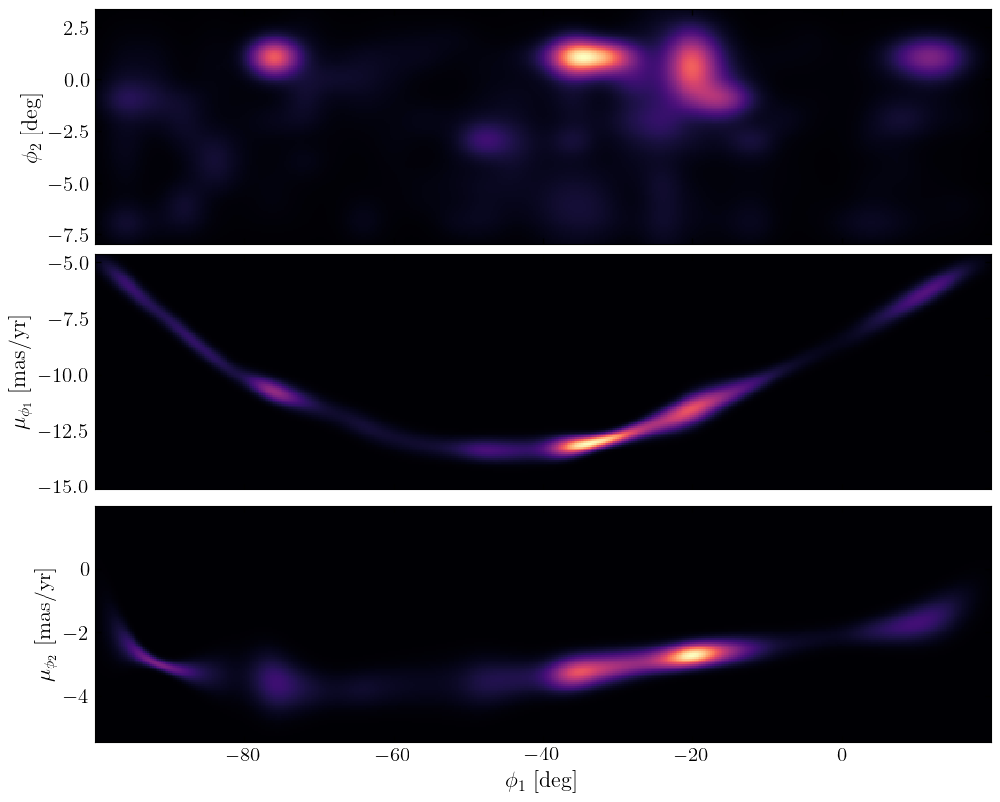

In [225]:
str_off_mm = ComponentMixtureModel(
    dist.Dirichlet(jnp.array([1.0, 1.0])),
    components=[stream_model, offtrack_model],
    tied_coordinates={"offtrack": {"pm1": "stream", "pm2": "stream"}},
)

str_off_mm_params = {
    "stream": MAP_p_expanded["stream"],
    "offtrack": MAP_p_expanded["offtrack"],
}
str_off_mm_packed_params = str_off_mm.pack_params(str_off_mm_params)
str_off_mm_packed_params["mixture-probs"] = MAP_p_expanded["mixture-probs"][1:]
str_off_mm_packed_params["mixture"] = jnp.stack([v for v in run_data.values()], axis=-1)

_ = str_off_mm.plot_model_projections(pars=str_off_mm_packed_params, grids=plot_grids, pcolormesh_kwargs=dict(rasterized=True, vmax=0.0003, vmin=0))

_ = mm['offtrack'].plot_model_projections(grids=plot_grids, pars=MAP_p_expanded['offtrack'])

## Make Linear Density Plot

In [230]:
stream_opt = mm['stream']
offtrack_opt = mm['offtrack']

stream_params = MAP_p_expanded['stream']
offtrack_params = MAP_p_expanded['offtrack']

grids_stream, ln_ns_stream = stream_opt.evaluate_on_2d_grids(pars=stream_params, grids=plot_grids, grid_coord_names=[("phi1", "phi2")])
grids_off, ln_ns_off = offtrack_opt.evaluate_on_2d_grids(pars=offtrack_params, grids=plot_grids, grid_coord_names=[("phi1", "phi2")])

In [244]:
phi1s = grids_stream[('phi1','phi2')][0][0][1:] - 0.1
stream_lin_dens = np.exp(ln_ns_stream[('phi1', 'phi2')]).sum(axis=0) / (phi1s[1]-phi1s[0])
off_lin_dens = np.exp(ln_ns_off[('phi1', 'phi2')]).sum(axis=0) / (phi1s[1]-phi1s[0])


phi2_track = IUS(stream_phi2_knots, stream_params['phi2']['loc_vals'])
phi2_width = IUS(stream_phi2_knots, stream_params['phi2']['scale_vals'])
pm1_track = IUS(stream_pm1_knots, stream_params['pm1']['loc_vals'])
pm1_width = IUS(stream_pm1_knots, stream_params['pm1']['scale_vals'])
pm2_track = IUS(stream_pm2_knots, stream_params['pm2']['loc_vals'])
pm2_width = IUS(stream_pm2_knots, stream_params['pm2']['scale_vals'])


phi2_track_no_off = IUS(stream_phi2_knots, MAP_p_no_off_expanded['stream']['phi2']['loc_vals'])
phi2_width_no_off = IUS(stream_phi2_knots, MAP_p_no_off_expanded['stream']['phi2']['scale_vals'])
pm1_track_no_off = IUS(stream_pm1_knots, MAP_p_no_off_expanded['stream']['pm1']['loc_vals'])
pm1_width_no_off = IUS(stream_pm1_knots, MAP_p_no_off_expanded['stream']['pm1']['scale_vals'])
pm2_track_no_off = IUS(stream_pm2_knots, MAP_p_no_off_expanded['stream']['pm2']['loc_vals'])
pm2_width_no_off = IUS(stream_pm2_knots, MAP_p_no_off_expanded['stream']['pm2']['scale_vals'])

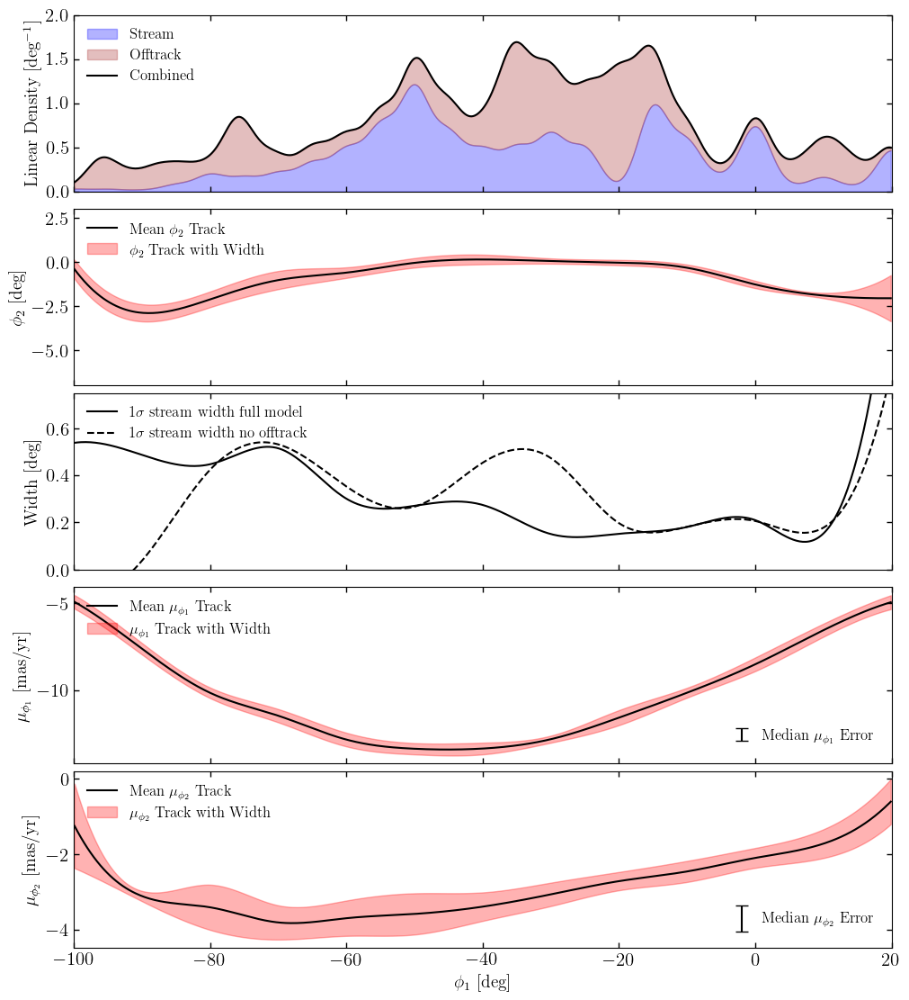

In [414]:
fig, [ax1, ax2, ax3, ax4, ax5] = plt.subplots(5, 1, figsize=(10,11), constrained_layout=True, sharex=True)
ax1.fill_between(phi1s, stream_lin_dens-stream_lin_dens, stream_lin_dens, color='b', alpha=0.3, label=r'Stream')
ax1.fill_between(phi1s, stream_lin_dens, stream_lin_dens+off_lin_dens, color='brown', alpha=0.3, label=r'Offtrack')
ax1.plot(phi1s, stream_lin_dens+off_lin_dens, color='k', label=r'Combined')
ax1.set_ylabel(r'Linear Density [deg$^{-1}$]', fontsize=14)
ax1.set_ylim(0,2)
ax1.legend(fontsize=12, loc='upper left')

ax2.plot(phi1s, phi2_track(phi1s), c='k', label=r'Mean $\phi_2$ Track')
ax2.fill_between(phi1s, phi2_track(phi1s) - phi2_width(phi1s), phi2_track(phi1s) + phi2_width(phi1s), 
                 color='r', alpha=0.3, label=r'$\phi_2$ Track with Width')
# ax2.fill_between(phi1s, phi2_track_no_off(phi1s) - phi2_width_no_off(phi1s), 
#                  phi2_track_no_off(phi1s) + phi2_width_no_off(phi1s), 
#                  color='b', alpha=0.3, label=r'$\phi_2$ Track with Width')
ax2.set_ylim(-7, 3)
ax2.set_ylabel(r'$\phi_2$ [deg]', fontsize=14)
ax2.legend(fontsize=12, loc='upper left')

ax3.plot(phi1s, phi2_width(phi1s), c='k', label=r'$1\sigma$ stream width full model')
ax3.plot(phi1s, phi2_width_no_off(phi1s), c='k', ls='dashed', label=r'$1\sigma$ stream width no offtrack')
ax3.set_ylim(0, 0.75)
ax3.set_ylabel(r'Width [deg]', fontsize=14)
ax3.legend(fontsize=12, loc='upper left')

ax4.plot(phi1s, pm1_track(phi1s), c='k', label=r'Mean $\mu_{\phi_1}$ Track')
ax4.errorbar(-2, -12.5, yerr=0.35, fmt='', capsize=5, color='black')
ax4.text(1, -12.8, r'Median $\mu_{\phi_1}$ Error', fontsize=12)
ax4.fill_between(phi1s, pm1_track(phi1s) - pm1_width(phi1s), pm1_track(phi1s) + pm1_width(phi1s), 
                 color='r', alpha=0.3, label=r'$\mu_{\phi_1}$ Track with Width')
# ax4.fill_between(phi1s, pm1_track_no_off(phi1s) - pm1_width_no_off(phi1s), 
#                  pm1_track_no_off(phi1s) + pm1_width_no_off(phi1s), 
#                  color='b', alpha=0.3, label=r'$\mu_{\phi_1}$ Track with Width')
ax4.set_ylabel(r'$\mu_{\phi_1}$ [mas/yr]', fontsize=14)
ax4.legend(fontsize=12, loc='upper left')

ax5.plot(phi1s, pm2_track(phi1s), c='k', label=r'Mean $\mu_{\phi_2}$ Track')
ax5.errorbar(-2, -3.7, yerr=0.35, fmt='', capsize=5, color='black')
ax5.text(1, -3.8, r'Median $\mu_{\phi_2}$ Error', fontsize=12)
ax5.fill_between(phi1s, pm2_track(phi1s) - pm2_width(phi1s), pm2_track(phi1s) + pm2_width(phi1s), 
                 color='r', alpha=0.3, label=r'$\mu_{\phi_2}$ Track with Width')
# ax5.fill_between(phi1s, pm2_track_no_off(phi1s) - pm2_width_no_off(phi1s), 
#                  pm2_track_no_off(phi1s) + pm2_width_no_off(phi1s), 
#                  color='b', alpha=0.3, label=r'$\mu_{\phi_2}$ Track with Width')
ax5.set_ylabel(r'$\mu_{\phi_2}$ [mas/yr]', fontsize=14)
ax5.legend(fontsize=12, loc='upper left')

ax5.set_xlim(-100, 20)
ax5.set_xlabel(r'$\phi_1$ [deg]', fontsize=14)

# plt.savefig('../paper_figures/stream_properties.pdf')
plt.show()

In [396]:
all_data_ = o.cat[pm_mask]
all_data = {k: np.array(all_data_[k], dtype="f8") for k in all_data_.colnames}

In [398]:
lp_dict = {}
for n_comp, component in enumerate(mm.components):
    
    print(component.name)
    dists = component.make_dists(MAP_p_expanded[component.name])

    component_lp_stack = jnp.empty((len(dists), len(all_data_)))

    for i, (coord_name, dist_) in enumerate(dists.items()):
        if isinstance(coord_name, tuple):
            _data = jnp.stack([all_data[k] for k in coord_name], axis=-1)
        else:
            _data = jnp.asarray(all_data[coord_name])

        if isinstance(dist_, (IndependentGMM, dist.Uniform)):
            variable_lp  = dist_.log_prob(value=_data)
        else:
            variable_lp = dist_.log_prob(value=_data, x=jnp.asarray(all_data['phi1']))
        component_lp_stack = component_lp_stack.at[i].set(variable_lp)
    # comp_lp = jax.scipy.special.logsumexp(component_lp_stack, axis=0) +lp
    comp_lp = jnp.sum(component_lp_stack, axis=0) + np.log(MAP_p_expanded['mixture-probs'][n_comp])
    lp_dict[component.name] = comp_lp
    print(comp_lp, jnp.max(comp_lp))  

background
[-10.77524177 -10.15480117 -11.86893831 ... -11.36370667 -12.82194492
 -11.2074037 ] -9.51625025412877
stream
[-230.65288985 -226.15077546 -108.22300162 ... -191.88776581 -111.08031388
 -153.89502237] -6.371631190384638
offtrack
[-152.70045415 -147.89518576  -29.43262789 ... -115.69867946  -36.04122795
  -77.03337573] -9.15617917708604


In [399]:
sum_probs = jnp.exp(lp_dict['background']) + jnp.exp(lp_dict['stream']) + jnp.exp(lp_dict['offtrack'])

In [400]:
memb_prob = (jnp.exp(lp_dict['stream']) + jnp.exp(lp_dict['offtrack'])) / sum_probs
print((memb_prob > 0.5).sum())
print((memb_prob > 0.9).sum())
print((memb_prob > 0.99).sum())

3251
1583
629


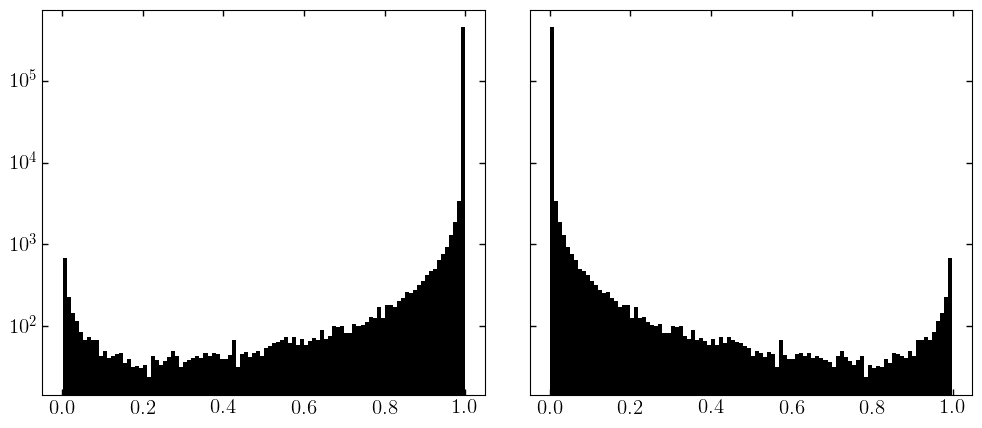

In [401]:
fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(12,5), sharey=True)
ax1.hist(jnp.exp(lp_dict['background']) / sum_probs, bins=100)
ax1.set_yscale('log')

ax2.hist(memb_prob, bins=100)
ax2.set_yscale('log')

plt.show()

In [405]:
np.array(memb_prob>0.5)

array([False, False, False, ..., False, False, False])

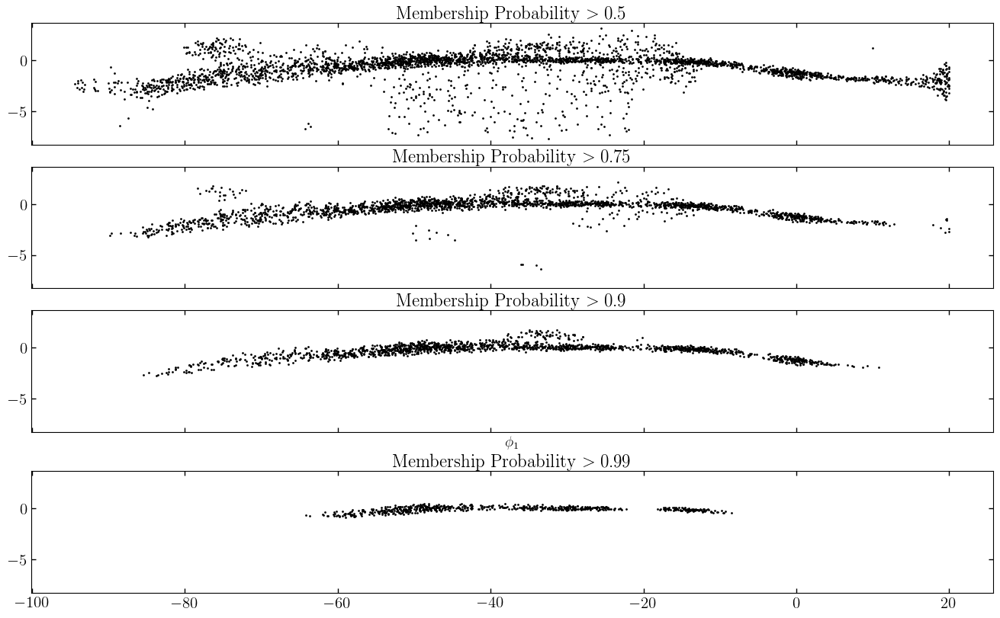

In [413]:
members = all_data_[np.array(memb_prob>0.5)]

fig, [ax1, ax2, ax3, ax4] = plt.subplots(4, 1, figsize=(13,8), sharex=True, sharey=True, constrained_layout=True)
ax1.scatter(members['phi1'], all_data_[np.array(memb_prob>0.5)]['phi2'], s=1)
ax1.set_title(r'Membership Probability $> 0.5$')

ax2.scatter(all_data_[np.array(memb_prob>0.75)]['phi1'], all_data_[np.array(memb_prob>0.75)]['phi2'], s=1)
ax2.set_title(r'Membership Probability $> 0.75$')

ax3.scatter(all_data_[np.array(memb_prob>0.9)]['phi1'], all_data_[np.array(memb_prob>0.9)]['phi2'], s=1)
ax3.set_title(r'Membership Probability $> 0.9$')

ax4.scatter(all_data_[np.array(memb_prob>0.99)]['phi1'], all_data_[np.array(memb_prob>0.99)]['phi2'], s=1)
ax4.set_title(r'Membership Probability $> 0.99$')

ax3.set_xlabel(r'$\phi_1$')
plt.show()

# Mixture of all components

### Variational Inference

Try to run this on the work computer and if that doesn't work, might need the CCA or figure something else out

In [ ]:
%%time

rng_key = jax.random.PRNGKey(8675309)

guide = AutoNormal(model=MixModel.setup_numpyro)
optimizer = numpyro.optim.Adam(step_size=1e-1) #play with this
svi = SVI(MixModel.setup_numpyro, guide, optimizer, loss=Trace_ELBO())
rng_key, rng_subkey = jax.random.split(key=rng_key)
svi_result = svi.run(
    rng_subkey,
    10_000,
    data=run_data,
    init_params=full_mix_params0
)

In [ ]:
params = svi_result.params
posterior_samples = guide.sample_posterior(jax.random.PRNGKey(1), params, sample_shape=(10000,))

### Optimization

In [135]:
full_mix_opt_pars, info = StreamMixtureModel.optimize(
    data=run_data,
    Components=full_Components,
    tied_params=tied_params,
    init_params=full_mix_params0,
    use_bounds=False,
)

# full_mix_opt_pars, info = optimize_mixture(StreamMixtureModel, data=run_data,
#                                       init_params=full_mix_params0, Components=full_Components,
#                                       use_bounds=True)

full_mix_opt = StreamMixtureModel(full_mix_opt_pars, Components=full_Components)
info

ScipyMinimizeInfo(fun_val=Array(0.68283109, dtype=float64, weak_type=True), success=True, status=0, iter_num=1698, hess_inv=Array([[ 7.70323214e-01, -2.24984805e-01,  7.53707840e-03, ...,
         1.08021333e-02,  6.04020731e-03, -1.86282329e-01],
       [-2.24984805e-01,  2.14573960e+02, -5.91080327e+00, ...,
         7.37656049e-01, -3.49072467e+00,  2.09414137e+00],
       [ 7.53707840e-03, -5.91080327e+00,  6.04441362e+01, ...,
        -1.54108928e-01, -2.51117096e-01, -6.29152298e+00],
       ...,
       [ 1.08021333e-02,  7.37656049e-01, -1.54108928e-01, ...,
         4.03870429e+01, -5.17781842e+00,  2.52933878e+01],
       [ 6.04020731e-03, -3.49072467e+00, -2.51117096e-01, ...,
        -5.17781842e+00,  1.52901462e+02, -5.44660298e+01],
       [-1.86282329e-01,  2.09414137e+00, -6.29152298e+00, ...,
         2.52933878e+01, -5.44660298e+01,  2.48617233e+03]],      dtype=float64), num_fun_eval=Array(1702, dtype=int32), num_jac_eval=Array(1702, dtype=int32), num_hess_eval=Array(

In [128]:
with open('../../data/full_model_opt_params_tied_params_no_bounds.pkl', 'wb') as output_file2:
    pickle.dump(full_mix_opt_pars, output_file2)

In [172]:
# with open('../data/full_model_optimization.pkl', 'rb') as input_file:
#     testing1 = pickle.load(input_file)

with open('../data/full_model_opt_params_small_sep.pkl', 'rb') as input_file:
    full_mix_opt_pars = pickle.load(input_file)

In [47]:
# if optimization fails, run again with initialization from the end of the last run

# full_mix_params1 = full_mix_opt_pars

# full_mix_opt_pars1, info1 = StreamMixtureModel.optimize(
#     data=run_data,
#     Components=full_Components,
#     #tied_params=tied_params,
#     init_params=full_mix_params1,
#     use_bounds=True,
# )
# full_mix_opt1 = StreamMixtureModel(full_mix_opt_pars1, Components=full_Components)
# info1

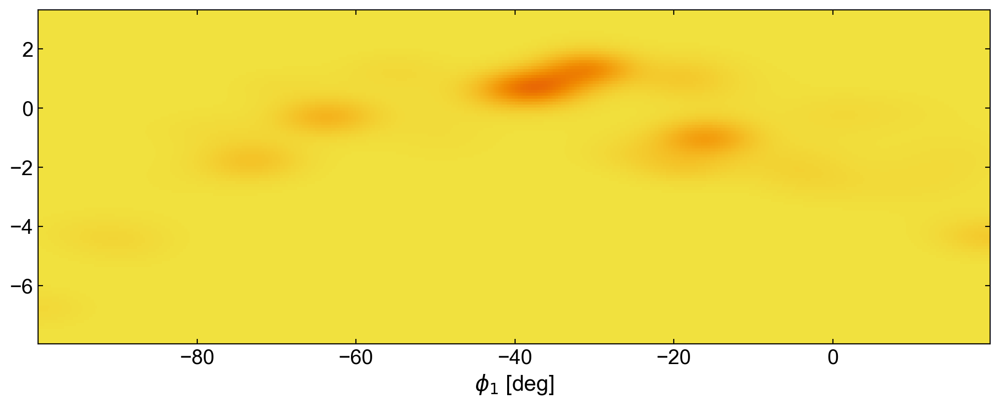

In [136]:
import copy
tmp_pars = copy.deepcopy(full_mix_opt_pars['offtrack'])
tmp_pars['pm1'] = full_mix_opt_pars['stream']['pm1'].copy()
tmp_pars['pm2'] = full_mix_opt_pars['stream']['pm2'].copy()
tmp = OffTrackModel(tmp_pars)
_,_,pcms = tmp.plot_model_projections(
    grid_coord_names=[("phi1", "phi2")], label=False, 
    pcolormesh_kwargs=dict(vmin=0, vmax=0.5, cmap='cmr.ember_r')
)

(<Figure size 1000x400 with 1 Axes>,
 array([<Axes: xlabel='$\\phi_1$ [deg]', ylabel='$\\phi_2$ [deg]'>],
       dtype=object),
 [<matplotlib.collections.QuadMesh at 0x1cbf22390>])

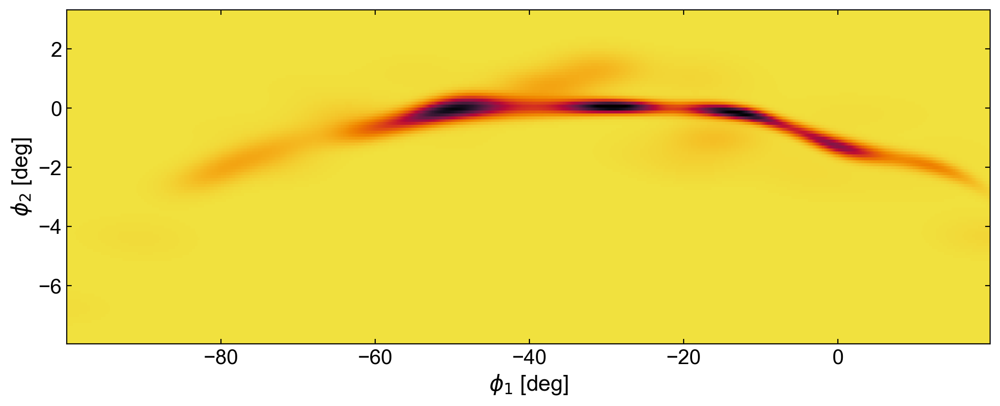

In [137]:
full_mix_nobkg_opt = StreamMixtureModel(
    full_mix_opt_pars, Components=[StreamDensModel, OffTrackModel], tied_params=tied_params
)
full_mix_nobkg_opt.plot_model_projections(
    grid_coord_names=[("phi1", "phi2")], pcolormesh_kwargs=dict(vmin=0, vmax=1, cmap='cmr.ember_r')
)

In [96]:
full_mix_opt.components

In [102]:
stream_comp, bkg_comp, offtrack_comp = full_mix_opt.components[0], full_mix_opt.components[1], full_mix_opt.components[2]
stream_ll = stream_comp.ln_number_density(run_data)
bkg_ll = bkg_comp.ln_number_density(run_data)
offtrack_ll = offtrack_comp.ln_number_density(run_data)

#one way
fg_ll = np.logaddexp(stream_ll, offtrack_ll)

#another way
# fg_comps = full_mix_nobkg_opt.components
# fg_ll_ = -np.log(fg_comps[0].get_N() + fg_comps[1].get_N()) + full_mix_nobkg_opt.ln_number_density(run_data)

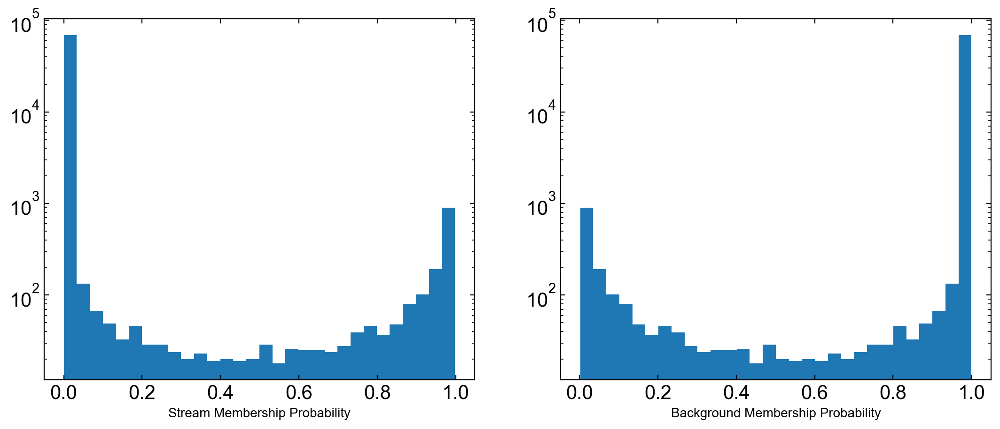

In [103]:
final_memb_prob = np.exp(fg_ll - np.logaddexp(fg_ll,bkg_ll)) #update for offtrack included
bkg_prob = np.exp(bkg_ll - np.logaddexp(fg_ll,bkg_ll))

fig, [ax1, ax2] = plt.subplots(1, 2, figsize=(13, 5))
ax1.hist(final_memb_prob, bins=30)
ax1.set_yscale('log')
ax1.set_xlabel('Stream Membership Probability')

ax2.hist(bkg_prob, bins=30)
ax2.set_xlabel('Background Membership Probability')
ax2.set_yscale('log')
plt.show()

In [104]:
(final_memb_prob > 0.99).sum()

449

In [105]:
# for the plotting, but takes a minute, so have it in a differnet cell
_grids, ln_dens = full_mix_opt.evaluate_on_2d_grids()

Text(0, 0.5, '$\\phi_2$')

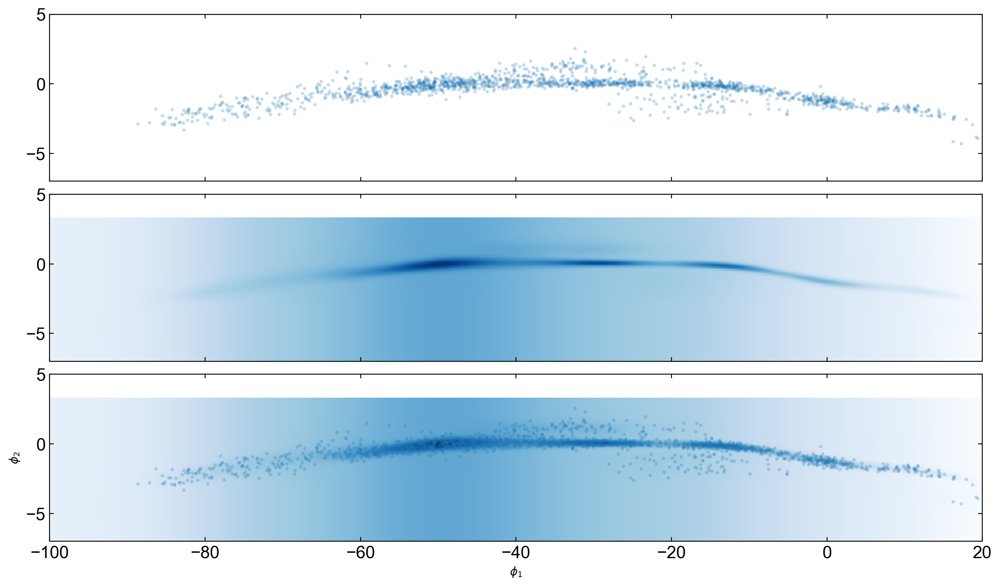

In [106]:
threshold = (final_memb_prob>0.5)

fig, axes = plt.subplots(3, 1, figsize=(12, 7), constrained_layout=True, sharex=True, sharey=True)
for ax in [axes[0], axes[2]]:
    ax.plot(
        run_data['phi1'][threshold],
        run_data['phi2'][threshold],
        marker="o",
        markeredgewidth=0,
        markersize=3.0,
        ls="none",
        alpha=0.25,
    )
    
for ax in [axes[1], axes[2]]:
    ax.pcolormesh(
        _grids[('phi1', 'phi2')][0],
        _grids[('phi1', 'phi2')][1],
        np.exp(ln_dens[('phi1', 'phi2')]),
        cmap="Blues",
        shading='auto'
    )
ax.set_xlim(-100, 20)
ax.set_ylim(-7, 5)

ax.set_xlabel(r"$\phi_1$")
ax.set_ylabel(r"$\phi_2$")

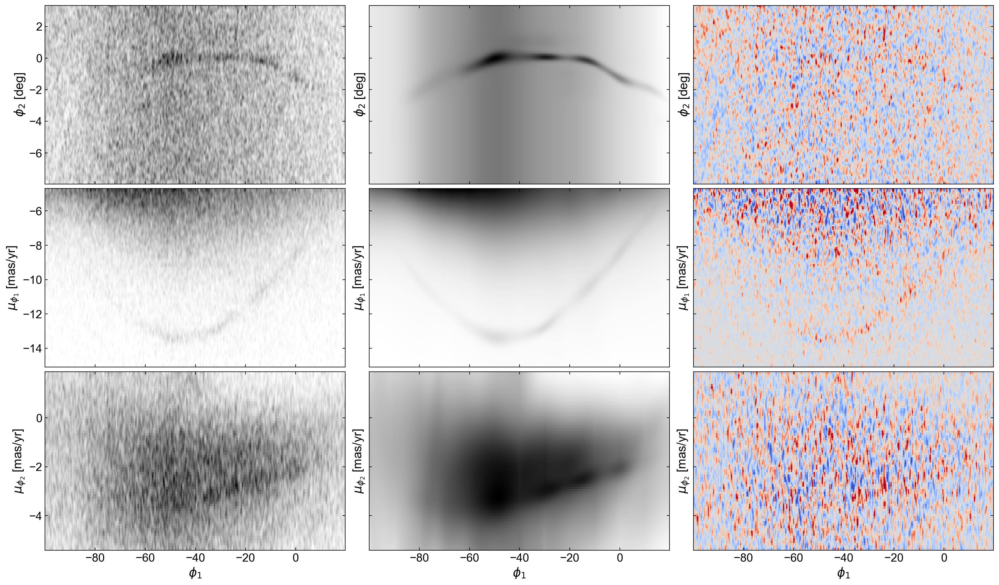

In [110]:
fig, axes = plt.subplots(
    len(full_mix_opt.coord_names) - 1,
    3, 
    figsize=(18, 3.5 * (len(full_mix_nobkg_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)

axes = np.atleast_2d(axes)
plot_data_projections(
    data=run_data,
    grids=stream_opt.default_grids,
    axes=axes[:, 0],
)
full_mix_opt.plot_model_projections(axes=axes[:, 1])
full_mix_opt.plot_residual_projections(
    data=run_data, axes=axes[:, 2], pcolormesh_kwargs=dict(vmin=-1, vmax=1)
)

for ax in axes[-1]:
    ax.set_xlabel(r"$\phi_1$")

KeyError: 'phi1'

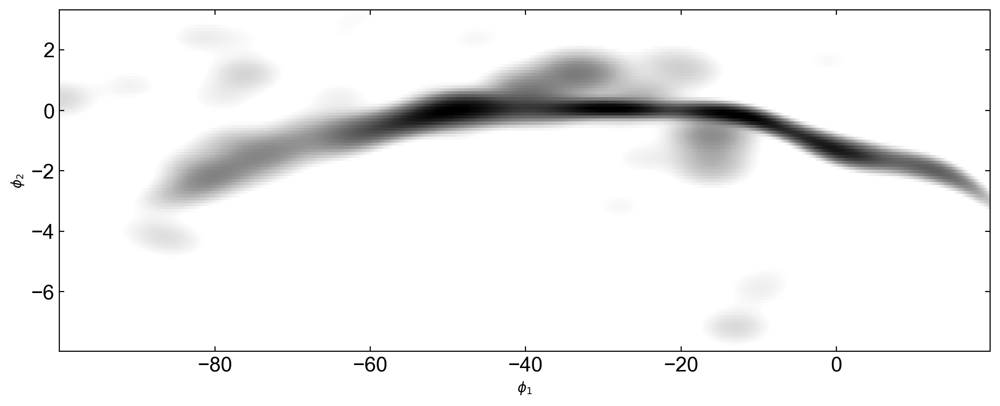

In [81]:
full_mix_nobkg_opt = StreamMixtureModel(
    full_mix_opt_pars, Components=[StreamDensModel, OffTrackModel], tied_params=tied_params
)
full_mix_nobkg_opt.plot_model_projections(
    grid_coord_names=[("phi1", "phi2")], pcolormesh_kwargs=dict(norm=mpl.colors.LogNorm(vmin=1e-2, vmax=1), cmap='Greys')
)

full_mix_nobkg_opt.plot_model_projections(
    grid_coord_names=[("phi1", "pm1")], pcolormesh_kwargs=dict(norm=mpl.colors.LogNorm(vmin=1e-2, vmax=1), cmap='Greys')
)

full_mix_nobkg_opt.plot_model_projections(
    grid_coord_names=[("phi1", "pm2")], pcolormesh_kwargs=dict(norm=mpl.colors.LogNorm(vmin=1e-2, vmax=1), cmap='Greys')
)

In [82]:
full_mix_opt.spar_steps

AttributeError: 'StreamMixtureModel' object has no attribute 'spar_steps'

KeyError: 'phi1'

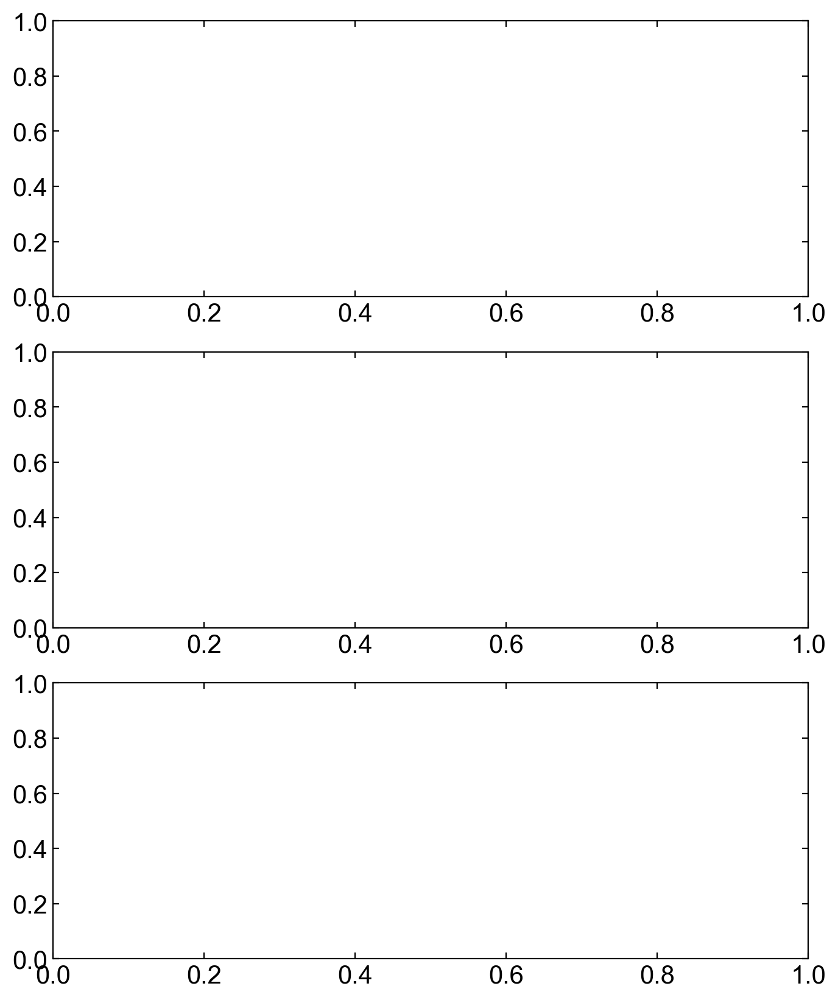

In [102]:
fig, axs = plt.subplots(3,1,figsize=(8,10))
full_mix_nobkg_opt.plot_model_projections(pcolormesh_kwargs=dict(vmin=0, vmax=0.5), axes=axs)

KeyError: 'phi1'

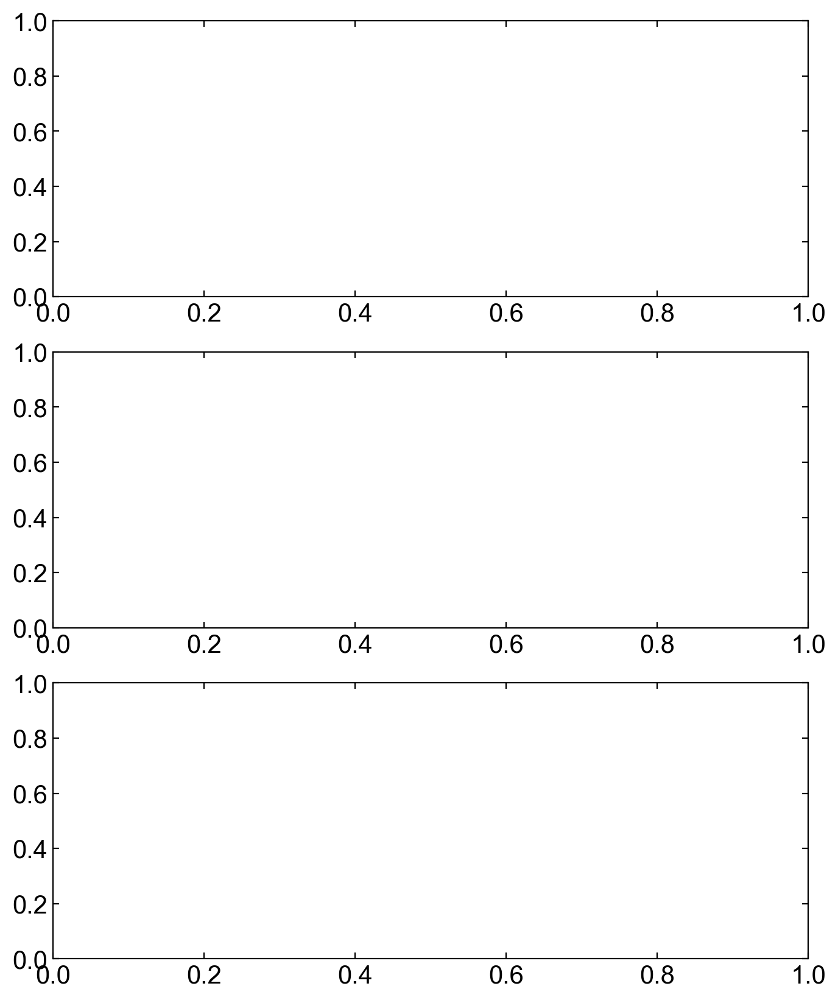

In [96]:
fig, axs = plt.subplots(3,1,figsize=(8,10))
full_mix_opt.plot_model_projections(pcolormesh_kwargs=dict(vmin=0, vmax=0.5), axes=axs)

TODO: how to plot projections for components where the x coord is in a joint, like OffTrack?

KeyError: 'phi1'

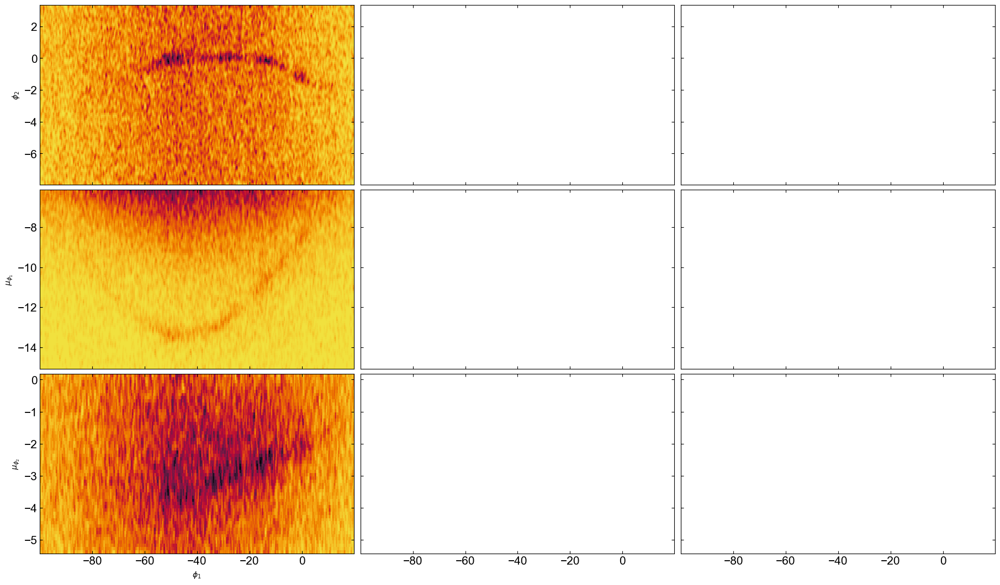

In [81]:
fig, axes = plt.subplots(
    len(stream_opt.coord_names) - 1,
    3, 
    figsize=(18, 3.5 * (len(stream_opt.coord_names) - 1)),
    sharex=True,
    sharey="row",
    constrained_layout=True,
)


axes = np.atleast_2d(axes)
plot_data_projections(
    data=run_data,
    grids=Base.default_grids,
    axes=axes[:, 0],
)
full_mix_opt1.plot_model_projections(axes=axes[:, 1])
full_mix_opt1.plot_residual_projections(
    data=run_data, axes=axes[:, 2], pcolormesh_kwargs=dict(vmin=-1, vmax=1)
)

for ax in axes[-1]:
    ax.set_xlabel(r"$\phi_1$")